In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
%matplotlib inline
# from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
import seaborn as sns
# from numba import jit, cuda # currently only for testing

# colors = sns.diverging_palette(240, 10, n=2) # red to blue
colors = sns.diverging_palette(150, 275, s=80, l=55, n=2) #green to purple
colors[0], colors[1] = colors[1], colors[0] # switch colors
cmap = 'PRGn'

from datetime import datetime
import os
from os import path
from tqdm.notebook import tqdm #compatible with jupyter
!jupyter nbextension enable --py widgetsnbextension --sys-prefix

FILEPATH = os.path.join(os.getcwd(), 'figs\\')
CLFPATH = os.path.join(os.getcwd(), 'clf\\')

from scipy.stats import norm

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [2]:
from sklearn.model_selection import GridSearchCV

from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
import xgboost as xgb
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

mods = ['SVM', 'MLP', 'RF', 'QDA'] # list of ML models (SVC removed on 12/8/2020), (KNN/XGBoost removed on 12/9/2020)
data = ['Gaussian XOR', 'Uniform XOR', 'Spiral', 'Gaussian R-XOR', 'Gaussian S-XOR'] # list of datasets

## Date/time of experiment

In [3]:
today = datetime.now()
print(today)

2021-03-15 20:40:07.364163


## Revised gaussian XOR generator

In [4]:
def generate_2d_rotation(theta=0, acorn=None):
    if acorn is not None:
        np.random.seed(acorn)
    
    R = np.array([
        [np.cos(theta), np.sin(theta)],
        [-np.sin(theta), np.cos(theta)]
    ])
    
    return R

In [5]:
def generate_gaussian_parity(n, mean=np.array([-1, -1]), cov_scale=1, angle_params=None, k=1, acorn=None, contain=True, cc=False):
    if acorn is not None:
        np.random.seed(acorn)
        
    d = len(mean)
    lim = abs(mean[0])
    
    if mean[0] == -1 and mean[1] == -1:
        mean = mean + 1 / 2**k
    elif mean[0] == -2 and mean[1] == -2:
        mean = mean + 1
    
    mnt = np.random.multinomial(n, 1/(4**k) * np.ones(4**k))
    cumsum = np.cumsum(mnt)
    cumsum = np.concatenate(([0], cumsum))
    
    Y = np.zeros(n)
    X = np.zeros((n, d))
    
    for i in range(2**k):
        for j in range(2**k):
            temp = np.random.multivariate_normal(mean, cov_scale * np.eye(d), 
                                                 size=mnt[i*(2**k) + j])
            if abs(mean[0]) == 0.5:
                temp[:, 0] += i*(1/2**(k-1))
                temp[:, 1] += j*(1/2**(k-1))
                
            elif abs(mean[0]) == 1:
                temp[:, 0] += i*2
                temp[:, 1] += j*2

            # screen out values outside the boundary
            if contain:
                if cc:
                # circular bbox
                    idx_oob = np.where(np.sqrt((temp**2).sum(axis=1)) > lim)

                    for l in idx_oob:
                        
                        while True:
                            temp2 = np.random.multivariate_normal(mean, cov_scale * np.eye(d), size=1)

                            if np.sqrt((temp2**2).sum(axis=1)) < lim:
                                temp[l] = temp2
                                break
                else: 
                # square bbox
                    idx_oob = np.where(abs(temp) > lim)
                    
                    for l in idx_oob:
                        
                        while True:
                            temp2 = np.random.multivariate_normal(mean, cov_scale * np.eye(d), size=1)

                            if (abs(temp2) < lim).all():
                                temp[l] = temp2
                                break
            
            X[cumsum[i*(2**k) + j]:cumsum[i*(2**k) + j + 1]] = temp
            
            if i % 2 == j % 2:
                Y[cumsum[i*(2**k) + j]:cumsum[i*(2**k) + j + 1]] = 0
            else:
                Y[cumsum[i*(2**k) + j]:cumsum[i*(2**k) + j + 1]] = 1
                
    if d == 2:
        if angle_params is None:
            angle_params = np.random.uniform(0, 2*np.pi)
            
        R = generate_2d_rotation(angle_params)
        X = X @ R
        
    else:
        raise ValueError('d=%i not implemented!'%(d))
       
    return X, Y.astype(int)

In [6]:
def generate_spirals(N, K=5, noise = 0.5, acorn = None, density=0.3, rng = 1):

    #N number of poinst per class
    #K number of classes
    X = []
    Y = []

    size = int(N/K) # equal number of points per feature

    if acorn is not None:
        np.random.seed(acorn)
    
    if K == 2:
        turns = 2
    elif K==3:
        turns = 2.5
    elif K==5:
        turns = 3.5
    elif K==7:
        turns = 4.5
    elif K==1:
        turns = 1
    else:
        print ("sorry, can't currently surpport %s classes " %K)
        return
    
    mvt = np.random.multinomial(N, 1/K * np.ones(K))
    
    if K == 2:
        r = np.random.uniform(0, rng, size=size)
        r = np.sort(r)
        t = np.linspace(0,  np.pi* 4 * turns/K, size) + noise * np.random.normal(0, density, size)
        dx = r * np.cos(t)
        dy = r * np.sin(t)

        X.append(np.vstack([dx, dy]).T)
        X.append(np.vstack([-dx, -dy]).T)
        Y += [0] * size 
        Y += [1] * size
    else:    
        for j in range(1, K+1):
            r = np.linspace(0.01, rng, int(mvt[j-1]))
            t = np.linspace((j-1) * np.pi *4 *turns/K,  j* np.pi * 4* turns/K, int(mvt[j-1])) + noise * np.random.normal(0, density, int(mvt[j-1]))
            dx = r * np.cos(t)
            dy = r * np.sin(t)

            dd = np.vstack([dx, dy]).T        
            X.append(dd)
            #label
            Y += [j-1] * int(mvt[j-1])
    return np.vstack(X), np.array(Y).astype(int)

In [7]:
def get_colors(colors, inds):
    c = [colors[i] for i in inds]
    return c

In [8]:
def generate_mask(l=-2, r=2, h=0.01):
    
    x = np.arange(l,r,h)
    y = np.arange(l,r,h)
    x,y = np.meshgrid(x,y)
    sample = np.c_[x.ravel(),y.ravel()]

    return sample#[:,0], sample[:,1]

In [9]:
def pdf(x, rotate=False, sig=0.25):
    
    # Generates true XOR posterior
    if rotate:
        mu01 = np.array([-0.5,0])
        mu02 = np.array([0.5,0])
        mu11 = np.array([0,0.5])
        mu12 = np.array([0,-0.5])
    else:
        mu01 = np.array([-0.5,0.5])
        mu02 = np.array([0.5,-0.5])
        mu11 = np.array([0.5,0.5])
        mu12 = np.array([-0.5,-0.5])
    cov = sig * np.eye(2)
    inv_cov = np.linalg.inv(cov) 

    p0 = (
        np.exp(-(x - mu01)@inv_cov@(x-mu01).T) 
        + np.exp(-(x - mu02)@inv_cov@(x-mu02).T)
    )/(2*np.pi*np.sqrt(np.linalg.det(cov)))

    p1 = (
        np.exp(-(x - mu11)@inv_cov@(x-mu11).T) 
        + np.exp(-(x - mu12)@inv_cov@(x-mu12).T)
    )/(2*np.pi*np.sqrt(np.linalg.det(cov)))

    # return p0-p1
    return p1/(p0+p1)

## Sham spiral true posterior

In [10]:
def pdf_spiral(N, K=2, noise=1, acorn = None, density=0.5, rng = 1):
    
    #N number of poinst per class
    #K number of classes
    X, Y, Z = [],[],[]
    X0, X1, Z0, Z1 = [], [], [], []

    size = int(N/K) # equal number of points per feature

    if acorn is not None:
        np.random.seed(acorn)
    
    if K == 2:
        turns = 2
    elif K==3:
        turns = 2.5
    elif K==5:
        turns = 3.5
    elif K==7:
        turns = 4.5
    elif K==1:
        turns = 1
    else:
        print ("sorry, can't currently surpport %s classes " %K)
        return
    
    mvt = np.random.multinomial(N, 1/K * np.ones(K))
    
    if K == 2:
        r = np.random.uniform(0, rng, size=size)
        r = np.sort(r)

        t = np.linspace(0, np.pi* 4 * turns/K, size) + noise * np.random.normal(0, density, size)
        dx = r * np.cos(t)
        dy = r * np.sin(t)

        # print(np.vstack([dx, dy]).T)

        # print(norm(0,1).pdf(np.vstack([dx, dy]).T)[:,0])
        Z0 += [1 for i in norm(0,1).pdf(np.vstack([dx, dy]).T)[:,0]]
        Z1 += [1 for i in norm(0,1).pdf(np.vstack([-dx, -dy]).T)[:,1]]
        
        Z += [1 for i in norm(0,1).pdf(np.vstack([dx, dy]).T)[:,0]]
        Z += [0 for i in norm(0,1).pdf(np.vstack([-dx, -dy]).T)[:,1]]
        # Z += np.subtract(Z0,Z1).tolist()
        # Z += np.subtract(Z1,Z0).tolist()
        # Z += np.split(np.array(norm(0,1).pdf(np.vstack([dx, dy]).T)[:,0]), 1)
        # Z += np.split(np.array(norm(0,1).pdf(np.vstack([-dx, -dy]).T)[:,0]), 1)

        # Z += [0.1] * size
        # Z += [0.1] * size

        X.append(np.vstack([dx, dy]).T)
        X.append(np.vstack([-dx, -dy]).T)

        X0.append(np.vstack([dx, dy]).T)
        X1.append(np.vstack([-dx, -dy]).T)

        Y += [0] * size 
        Y += [1] * size
    else:    
        for j in range(1, K+1):
            r = np.linspace(0.01, rng, int(mvt[j-1]))
            t = np.linspace((j-1) * np.pi *4 *turns/K,  j* np.pi * 4* turns/K, int(mvt[j-1])) + noise * np.random.normal(0, density, int(mvt[j-1]))
            dx = r * np.cos(t)
            dy = r * np.sin(t)

            dd = np.vstack([dx, dy]).T        
            X.append(dd)
            #label
            Y += [j-1] * int(mvt[j-1])
    return np.vstack(X), np.array(Y).astype(int), Z, np.vstack(X0), np.vstack(X1), Z0, Z1


## Spiral True posterior (work in progress)

In [11]:
def pdf1(x, rotate=False, sig=0.25, rng=1):
    
    # a, b, c, d, e, f, g = pdf_spiral(100, noise=0, K=2)
    x0, x1 = spiral_center(120, K=2, rng=rng)

    mu01 = x0
    mu02 = x1
    cov = sig * np.eye(2)
    inv_cov = np.linalg.inv(cov) 

    p0,p1 = 0,0
    for mu in mu01:
        p0 += np.exp(-(x - mu)@inv_cov@(x-mu).T)
    for mu in mu02:
        p1 += np.exp(-(x - mu)@inv_cov@(x-mu).T)

    p0 = p0/(2*np.pi*np.sqrt(np.linalg.det(cov)))
    p1 = p1/(2*np.pi*np.sqrt(np.linalg.det(cov)))

    return p0/(p0+p1)

def true_spiral(l=-2, r=2, h=0.01, sig=0.01, rng=1, rotate=False, cc=False):
    X = generate_mask(l=l, r=r, h=h)
    
    z = np.zeros(len(X),dtype=float)
    z[:] = 0.5

    for ii,x in enumerate(tqdm(X)):
        if np.any([x <= -1.0, x >= 1.0]) and cc==False: #or x.any() > 1
            z[ii] = 0.5
            # pass
        elif np.sqrt((x**2).sum(axis=0)) > 1 and cc==True:
            z[ii] = 0.5
        else:
            nantest = 1-pdf1(x, rotate=rotate, sig=sig, rng=rng)#/np.sqrt(4)
            if str(nantest) != 'nan':
                pass
            else:
                print ('There is {} at {} {}'.format(nantest, ii, x))
                break
            z[ii] = nantest
        # z[ii] = 1-pdf(x, rotate=rotate, sig=sig)

    z = (z - min(z)) / (max(z) - min(z))

    return X[:,0], X[:,1], z

def spiral_center(N, K=2, rng=2):
    
    #N number of poinst per class
    #K number of classes
    X0, X1 = [],[]
    
    if K == 2:
        turns = 2

    size = int(N/K) # equal number of points per feature
    
    if K == 2:
        r = np.linspace(0, rng, size)
        r = np.sort(r)

        t = np.linspace(0, np.pi* 4 * turns/K, size)# + noise * np.random.normal(0, density, size)
        dx = r * np.cos(t)
        dy = r * np.sin(t)

        X0.append(np.vstack([dx, dy]).T)
        X1.append(np.vstack([-dx, -dy]).T)

    return np.vstack(X0), np.vstack(X1)

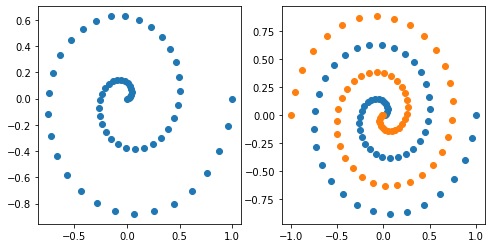

In [12]:
fig, ax = plt.subplots(1,2, figsize=(8,4))

a,b = spiral_center(120, rng=1)
ax[0].scatter(a[:,0],a[:,1])
ax[1].scatter(a[:,0],a[:,1])
ax[1].scatter(b[:,0],b[:,1])

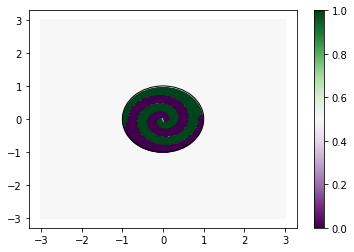

In [13]:
tx, ty, tc = true_spiral(-3,3,0.01,0.00008,rng=1,cc=True) #sig cannot go lower than 0.00008

fig, ax = plt.subplots()

mlp = ax.scatter(tx,ty, c=tc, s=1, cmap='PRGn')
fig.colorbar(mlp)
ax.add_patch(Circle((0,0), radius=1, edgecolor='k', fill=False))

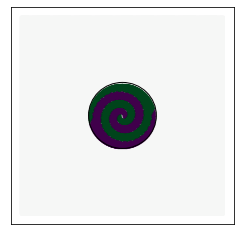

In [14]:
fig, ax = plt.subplots(figsize=(4,4))

mlp = ax.scatter(tx,ty, c=tc, s=1, cmap='PRGn')
# fig.colorbar(mlp)
ax.set_xticks([])
ax.set_yticks([])
ax.add_patch(Circle((0,0), radius=1, edgecolor='k', fill=False))

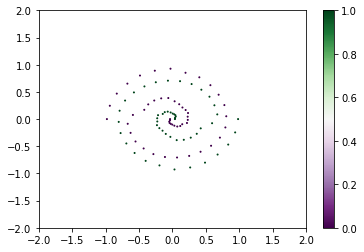

In [15]:
a, b, c, d, e, f, g = pdf_spiral(100, noise=0, K=2)#generate_spirals(750, K=2)
plt.scatter(a[:,0],a[:,1], c=c, cmap=cmap, s=1)
plt.xlim(-2,2)
plt.ylim(-2,2)
plt.colorbar()

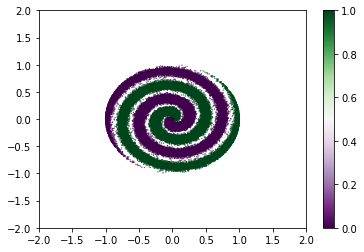

In [16]:
a, b, c, d, e, f, g = pdf_spiral(100000, noise=.9, K=2)#generate_spirals(750, K=2)
plt.scatter(a[:,0],a[:,1], c=c, cmap=cmap, s=0.1)
plt.xlim(-2,2)
plt.ylim(-2,2)
plt.colorbar()

In [17]:
def normalize(p, q):
    z = p - q
    z = (z - min(z)) / (max(z) - min(z))

    return z

In [18]:
from IPython.display import clear_output

def overlay_points(x1, x2, p):

    # X = x2.copy()
    X = np.zeros(len(x2)) + 0.5
    idx_list = [i for i in range(len(x2))]#np.linspace(0, len(x2))

    if len(x1) > len(x2):
        print('ERROR: size of x2 too small')
        return

    for idx, i in enumerate(x1):
        bestD = None
        bestX = None

        clear_output(wait=True)
        

        for j in idx_list:
            
            tempD = np.sqrt( (i[0]-x2[j][0])**2 + (i[1]-x2[j][1])**2)

            if bestD == None:
                bestD = tempD
                bestX = j
            
            if bestD > tempD:
                bestD = tempD
                bestX = j

        print(idx, '/', len(x1), '[', bestX ,']')
        X[bestX] = p[idx]
        # x2.remove(j)
        idx_list.remove(bestX)

    return X


In [19]:
def true_xor(l=-2, r=2, h=0.01, rotate=False, sig=0.25, cc=False):
    X = generate_mask(l=l, r=r, h=h)
    
    z = np.zeros(len(X),dtype=float)

    for ii,x in enumerate(X):
        if np.any([x <= -1.0, x >= 1.0]) and cc==False: #or x.any() > 1
            z[ii] = 0.5
            # pass
        elif np.sqrt((x**2).sum(axis=0)) > 1 and cc==True:
            z[ii] = 0.5
        else:
            z[ii] = 1-pdf(x, rotate=rotate, sig=sig)#)/np.sqrt(4)
        # z[ii] = 1-pdf(x, rotate=rotate, sig=sig)

    z = (z - min(z)) / (max(z) - min(z))

    return X[:,0], X[:,1], z

In [20]:
#likelihood
def true_xor_likelihood(l=-2, r=2, h=0.01, rotate=False, sig=0.25):
    X = generate_mask(l=l, r=r, h=h)
    
    z = np.zeros(len(X),dtype=float)

    for ii,x in enumerate(X):
    #     if np.any([x <= -1.0, x >= 1.0]): #or x.any() > 1
    #         z[ii] = 0.5
    #     else:
        z[ii] = (1-pdf(x))/np.sqrt(4)
        # z[ii] = 1-pdf(x, rotate=rotate, sig=sig)

    z = (z - min(z)) / (max(z) - min(z))

    return X[:,0], X[:,1], z

## Posterior test case 

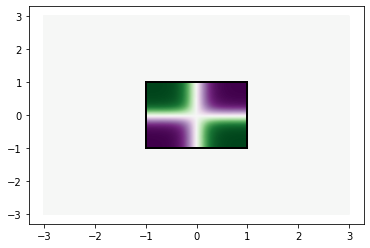

In [21]:
h = 0.01
tempX, tempY, tempC = true_xor(l=-3, r=3, h=h, rotate=False, sig=0.25)

fig, axs = plt.subplots(1,1)

# axs.set_xticks([])
# axs.set_yticks([])
# axs.set_xlim(np.multiply([-2,2], 1))
# axs.set_ylim(np.multiply([-2,2], 1)) 
axs.scatter(tempX, tempY, c=tempC, s=1, cmap=cmap)
axs.add_patch(Rectangle(
                (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))

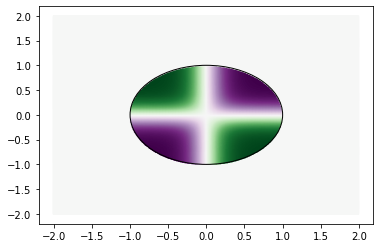

In [22]:
h = 0.01
# tempX = generate_mask(h=h)
tempX, tempY, tempC = true_xor(h=h, rotate=False, sig=0.25, cc=True)

fig, axs = plt.subplots(1,1)

axs.scatter(tempX, tempY, c=tempC, s=1, cmap=cmap)
axs.add_patch(Circle((0,0), radius=1, edgecolor='k', fill=False))

In [23]:
def true_Uxor(l=-2, r=2, h=0.01, cc=False):

    X = generate_mask(l=l, r=r, h=h)

    l=-1
    r=1

    z = np.zeros(len(X),dtype=float) + 0.5

    for i, loc in enumerate(X):
        X0 = loc[0]
        X1 = loc[1]
        
        if X0 > l and X0 < 0 and X1 < r and X1 > 0:
            z[i] = 1
        elif X0 > 0 and X0 < r and X1 < r and X1 > 0:
            z[i] = 0
        elif X0 > l and X0 < 0 and X1 < 0 and X1 > l:
            z[i] = 0
        elif X0 > 0 and X0 < r and X1 < 0 and X1 > l:
            z[i] = 1
        
        if np.sqrt((np.c_[X0,X1]**2).sum(axis=1)) > 1 and cc==True:
            z[i] = 0.5

    return X[:,0],X[:,1],z
            

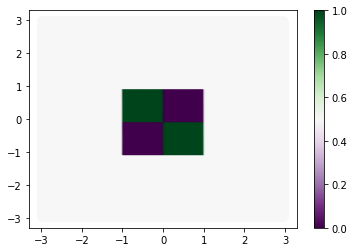

In [24]:
h = 0.01
# tempX = generate_mask(h=h)
tempX, tempY, tempC = true_Uxor(l=-3, r=3, h=h)
plt.scatter(tempX, tempY, c=tempC, cmap=cmap)
plt.colorbar()

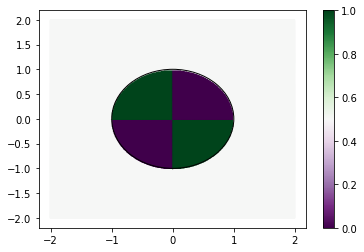

In [25]:
h = 0.01
# tempX = generate_mask(h=h)
tempX, tempY, tempC = true_Uxor(h=h, cc=True)
fig, axs = plt.subplots(1,1)

pms = axs.scatter(tempX, tempY, c=tempC, s=1, cmap=cmap)
axs.add_patch(Circle((0,0), radius=1, edgecolor='k', fill=False))
fig.colorbar(pms)

In [26]:
def generate_uniform_XOR(b=1, N=750, cc=False):

    boundary = np.random.multinomial(N, [1/4.]*4)
    bcum = np.cumsum(boundary)

    X = np.array([[0,0]])
    Y = np.zeros(N)
    Y[bcum[0]:bcum[2]] = 1
    ol = 0.0 # degree of overlap

    for i in range(2):
        for j in range(2):
            
            idx = 2*i+j

            if i == 1:
                tempX = np.random.uniform(ol,-b,boundary[idx])
            else: 
                tempX = np.random.uniform(-ol,b,boundary[idx])

            if j == 1:
                tempY = np.random.uniform(ol,-b,boundary[idx])
            else:
                tempY = np.random.uniform(-ol,b,boundary[idx])


            temp = np.c_[tempX,tempY]

            if cc:
                # circular bbox
                idx_oob = np.where(np.sqrt((temp**2).sum(axis=1)) > 1)
                # print(idx_oob)

                for l in idx_oob:
                    
                    while True:

                        if i == 1:
                            tempX = np.random.uniform(ol,-b,1)
                        else: 
                            tempX = np.random.uniform(-ol,b,1)

                        if j == 1:
                            tempY = np.random.uniform(ol,-b,1)
                        else:
                            tempY = np.random.uniform(-ol,b,1)

                        temp2 = np.c_[tempX,tempY]

                        if np.sqrt((temp2**2).sum(axis=1)) < 1:
                            temp[l] = temp2
                            break

                X = np.concatenate((X, temp))

            else:
                X = np.concatenate((X, np.c_[tempX, tempY]))
            
    return X[1:], Y.astype('int')

In [27]:
def select_dataset(dset=0, cc=False):

    if cc:
        if dset == 0:
            return CgausX, CgausY, Cnew_gausX, Cnew_gausY
        elif dset == 1:
            return CunifX, CunifY, Cnew_unifX, Cnew_unifY
        elif dset == 2:
            return spirX, spirY, new_spirX, new_spirY
        elif dset == 3:
            return CgausRX, CgausRY, Cnew_gausRX, Cnew_gausRY
        elif dset == 4:
            return CgausSX, CgausSY, Cnew_gausSX, Cnew_gausSY
        else:
            print ("ERROR: DATASET DOES NOT EXIST")
            return
    else:

        if dset == 0:
            return gausX, gausY, new_gausX, new_gausY
        elif dset == 1:
            return unifX, unifY, new_unifX, new_unifY
        elif dset == 2:
            return spirX, spirY, new_spirX, new_spirY
        elif dset == 3:
            return gausRX, gausRY, new_gausRX, new_gausRY
        elif dset == 4:
            return gausSX, gausSY, new_gausSX, new_gausSY
        else:
            print ("ERROR: DATASET DOES NOT EXIST")
            return

## Generating gaussian data

In [28]:
gausX, gausY = generate_gaussian_parity(750, mean=np.array([-1,-1]), cov_scale=0.1, angle_params=np.pi)
new_gausX, new_gausY = generate_gaussian_parity(750, mean=np.array([-2,-2]), cov_scale=0.4, angle_params=np.pi)

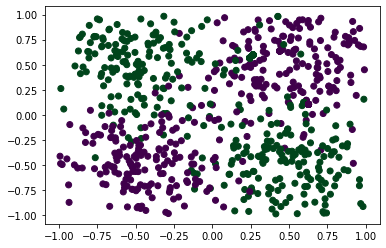

In [29]:
# plt.scatter(gausX[:,0],gausX[:,1], c=get_colors(colors, gausY))
plt.scatter(gausX[:,0],gausX[:,1], c=gausY, cmap=cmap)

In [30]:
CgausX, CgausY = generate_gaussian_parity(750, mean=np.array([-1,-1]), cov_scale=0.1, angle_params=np.pi, cc=True)
Cnew_gausX, Cnew_gausY = generate_gaussian_parity(750, mean=np.array([-2,-2]), cov_scale=0.4, angle_params=np.pi, cc=True)

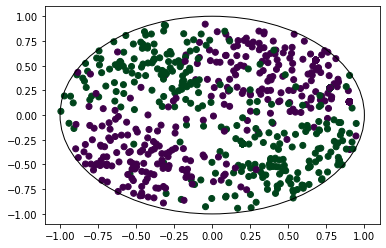

In [31]:
fig, ax = plt.subplots()
ax.scatter(CgausX[:,0],CgausX[:,1], c=gausY, cmap=cmap)
ax.add_patch(Circle((0,0), radius=1, edgecolor='k', fill=False))

In [32]:
gausRX, gausRY = generate_gaussian_parity(750, mean=np.array([-1,-1]), cov_scale=0.1, angle_params=np.pi/4)
new_gausRX, new_gausRY = generate_gaussian_parity(750, mean=np.array([-2,-2]), cov_scale=0.4, angle_params=np.pi/4)

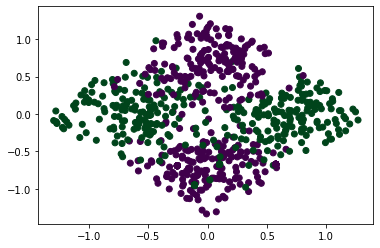

In [33]:
# plt.scatter(gausRX[:,0],gausRX[:,1], c=get_colors(colors, gausRY))
plt.scatter(gausRX[:,0],gausRX[:,1], c=gausRY, cmap=cmap)

In [34]:
CgausRX, CgausRY = generate_gaussian_parity(750, mean=np.array([-1,-1]), cov_scale=0.1, angle_params=np.pi/4, cc=True)
Cnew_gausRX, Cnew_gausRY = generate_gaussian_parity(750, mean=np.array([-2,-2]), cov_scale=0.4, angle_params=np.pi/4, cc=True)

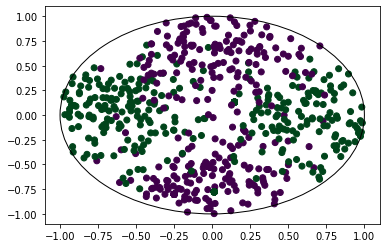

In [35]:
fig, ax = plt.subplots()
ax.scatter(CgausRX[:,0],CgausRX[:,1], c=CgausRY, cmap=cmap)
ax.add_patch(Circle((0,0), radius=1, edgecolor='k', fill=False))

In [36]:
gausSX, gausSY = generate_gaussian_parity(750, mean=np.array([-1,-1]), cov_scale=0.01, angle_params=np.pi)
new_gausSX, new_gausSY = generate_gaussian_parity(750, mean=np.array([-2,-2]), cov_scale=0.12, angle_params=np.pi)

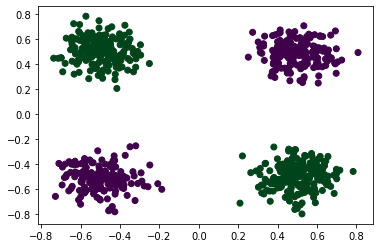

In [37]:
# plt.scatter(gausSX[:,0],gausSX[:,1], c=get_colors(colors, gausSY))
plt.scatter(gausSX[:,0],gausSX[:,1], c=gausSY, cmap=cmap)

In [38]:
CgausSX, CgausSY = generate_gaussian_parity(750, mean=np.array([-1,-1]), cov_scale=0.01, angle_params=np.pi, cc=True)
Cnew_gausSX, Cnew_gausSY = generate_gaussian_parity(750, mean=np.array([-2,-2]), cov_scale=0.12, angle_params=np.pi, cc=True)

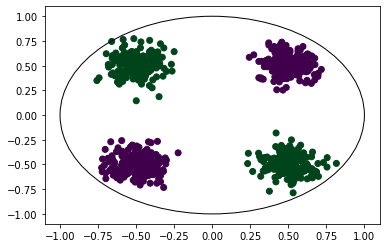

In [39]:
fig, ax = plt.subplots()
ax.scatter(CgausSX[:,0],CgausSX[:,1], c=CgausSY, cmap=cmap)
ax.add_patch(Circle((0,0), radius=1, edgecolor='k', fill=False))

## Generating uniform XOR data

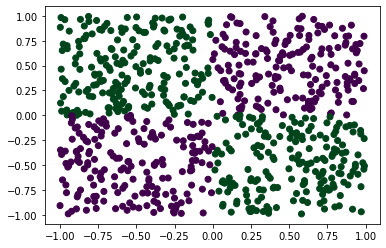

In [40]:
unifX, unifY = generate_uniform_XOR()
new_unifX, new_unifY = generate_uniform_XOR(b=2)
# plt.scatter(unifX[:,0], unifX[:,1], c=get_colors(colors, unifY))
plt.scatter(unifX[:,0],unifX[:,1], c=unifY, cmap=cmap)

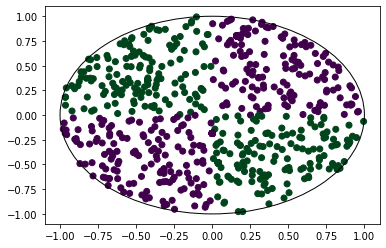

In [41]:
CunifX, CunifY = generate_uniform_XOR(cc=True)
Cnew_unifX, Cnew_unifY = generate_uniform_XOR(cc=True)
fig, ax = plt.subplots()
ax.scatter(CunifX[:,0],CunifX[:,1], c=CunifY, cmap=cmap)
ax.add_patch(Circle((0,0), radius=1, edgecolor='k', fill=False))

## Generating spiral data

In [42]:
spirX, spirY = generate_spirals(750, 2, noise = 2.5, rng=1)
new_spirX, new_spirY = generate_spirals(750, 2, noise = 2.5, rng=2)

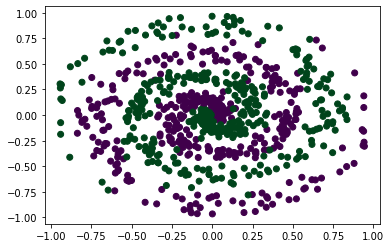

In [43]:
# plt.scatter(spirX[:,0],spirX[:,1], c=get_colors(colors, spirY))
plt.scatter(spirX[:,0],spirX[:,1], c=spirY, cmap=cmap)

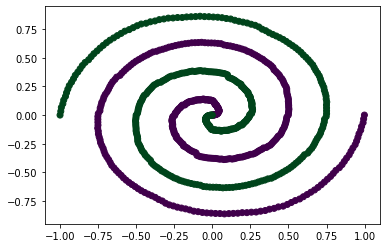

In [44]:
# no noise simulation
tempspirX, tempspirY = generate_spirals(750, K=2, noise=0, rng=1)
# plt.scatter(tempspirX[:,0],tempspirX[:,1], c=get_colors(colors, tempspirY))
plt.scatter(tempspirX[:,0],tempspirX[:,1], c=tempspirY, cmap=cmap)

In [45]:
filename = 'clf/dataset1.pickle'

if path.exists(filename):
    with open(filename, 'rb') as f:
        dataset = pickle.load(f, encoding='bytes')

    gausX, gausY, new_gausX, new_gausY = dataset[0]
    unifX, unifY, new_unifX, new_unifY = dataset[1]
    spirX, spirY, new_spirX, new_spirY = dataset[2]
    gausRX, gausRY, new_gausRX, new_gausRY = dataset[3]
    gausSX, gausSY, new_gausSX, new_gausSY = dataset[4]    

    print('[', filename, '] loaded')

else: 
    print('creating new datasets..')
    sTime = datetime.now()
    
    if not os.path.isdir(CLFPATH):
        os.makedirs(CLFPATH)

    with open(filename, 'wb') as f:
        temp = []
        for i in range(5):
            temp.append(select_dataset(i))
        pickle.dump(temp, f)

    deltaT = datetime.now() - sTime
    print('completed after ' + str(deltaT.seconds) + ' seconds')
    print('saved as [', filename, ']')

[ clf/dataset1.pickle ] loaded


In [46]:
filename = 'clf/Cdataset1.pickle'

if path.exists(filename):
    with open(filename, 'rb') as f:
        dataset = pickle.load(f, encoding='bytes')

    CgausX, CgausY, Cnew_gausX, Cnew_gausY = dataset[0]
    CunifX, CunifY, Cnew_unifX, Cnew_unifY = dataset[1]
    spirX, spirY, new_spirX, new_spirY = dataset[2]
    CgausRX, CgausRY, Cnew_gausRX, Cnew_gausRY = dataset[3]
    CgausSX, CgausSY, Cnew_gausSX, Cnew_gausSY = dataset[4]    

    print('[', filename, '] loaded')

else: 
    print('creating new datasets..')
    sTime = datetime.now()
    
    if not os.path.isdir(CLFPATH):
        os.makedirs(CLFPATH)

    with open(filename, 'wb') as f:
        temp = []
        for i in range(5):
            temp.append(select_dataset(i, cc=True))
        pickle.dump(temp, f)

    deltaT = datetime.now() - sTime
    print('completed after ' + str(deltaT.seconds) + ' seconds')
    print('saved as [', filename, ']')

[ clf/Cdataset1.pickle ] loaded


## training algorithms

In [47]:
def train_algo(dset, enable=[0,0,1,0,1,1], savefile=True, cc=False):
    
    mods = ['KNN', 'SVC', 'SVM', 'XGBoost', 'MLP', 'RF'] #local mods list
    
    def tune_param(clf, param, name):
        
        model=GridSearchCV(clf, param_grid=param, return_train_score=True, cv=20)
        model.fit(train_X, train_y)
        
        print(name + " INFO:")
        print("Best hyper paramters:",model.best_params_)
        print("Best accuracy value: ",model.best_score_)
        
        clf.set_params(**model.best_params_)
        clf.fit(train_X, train_y)
        print("prediction score: ", model.score(test_X, test_y))
        print(clf)
        
        # plot_posterior(X, y, newX, newy, clf, name, savefile)        
        # xx, yy, Z, new_p, zz = plot_decision_boundaries(X, y ,clf, h=h)
        return clf

    post = []

    train_X, train_y, test_X, test_y = select_dataset(dset, cc=cc)

    ##### KNN #####
    
    if enable[0] == 1:
        tuned_param=[{'n_neighbors':[3,5,7], 'leaf_size':range(10,100,10)},
                     {'n_neighbors':[3,5,7], 'leaf_size':range(10,100,10)},
                     {'n_neighbors':[7]},
                     {'n_neighbors':[3,5,7], 'leaf_size':range(10,100,10)},
                     {'n_neighbors':[3,5,7], 'leaf_size':range(10,100,10)}]
        temp = tune_param(KNeighborsClassifier(), tuned_param[dset], mods[0])
        post.append(temp)

    ##### SVC #####
    
    if enable[1] == 1:
        tuned_param=[{'gamma':['auto'], 'probability':[True]},
                     {'gamma':['auto'], 'probability':[True]},
                     {'C':np.linspace(1,10,10), 'probability':[True]},
                     {'gamma':['auto'], 'probability':[True]},
                     {'gamma':['auto'], 'probability':[True]}]
        temp = tune_param(svm.SVC(), tuned_param[dset], mods[1])
        post.append(temp)
                   
    ##### nuSVC #####
    
    if enable[2] == 1:
        tuned_param=[{'gamma':['auto'], 'probability':[True]},
                     {'gamma':['auto'], 'probability':[True]},
                     {'probability':[True]},
                     {'gamma':['auto'], 'probability':[True]},
                     {'gamma':['auto'], 'probability':[True]}]
        temp = tune_param(svm.NuSVC(), tuned_param[dset], mods[2])
        post.append(temp)

    ##### xgbooster #####
    
    if enable[3] == 1:
        tuned_param=[ {'n_jobs':[-1], 'learning_rate':np.linspace(0,1,20),'n_estimators':[64,128,256], 
                     'gamma': [0], 'objective':['binary:logistic']},
                     {'n_jobs':[-1], 'learning_rate':np.linspace(0,1,20),'n_estimators':[64,128,256], 
                     'gamma': [0], 'objective':['binary:logistic']},
                    {'n_jobs':[-1], 'learning_rate':np.linspace(0,1,20),'n_estimators':[64,128,256], 
                    'gamma': [0]},
                    {'n_jobs':[-1], 'learning_rate':np.linspace(0,1,20),'n_estimators':[64,128,256], 
                     'gamma': [0], 'objective':['binary:logistic']},
                     {'n_jobs':[-1], 'learning_rate':np.linspace(0,1,20),'n_estimators':[64,128,256], 
                     'gamma': [0], 'objective':['binary:logistic']}]
        temp = tune_param(xgb.XGBClassifier(objective='binary:logistic'), 
                             tuned_param[dset], mods[3])
        post.append(temp)
    
    #### mlp #####
    
    if enable[4] == 1:
        tuned_param=[{'alpha':[0], 'max_iter':[7000], 'hidden_layer_sizes':[100], 'learning_rate_init':[0.0001]},
                    {'alpha':[0], 'max_iter':[7000], 'hidden_layer_sizes':[100], 'learning_rate_init':[0.0001]},
                    {'alpha':[0], 'max_iter':[10000], 'activation':['logistic', 'relu'], 'learning_rate_init':[0.0001], 'solver': ['lbfgs']},
                    {'alpha':[0], 'max_iter':[7000], 'hidden_layer_sizes':[100], 'learning_rate_init':[0.0001]},
                    {'alpha':[0], 'max_iter':[7000], 'hidden_layer_sizes':[100], 'learning_rate_init':[0.0001]}]
        temp = tune_param(MLPClassifier(), tuned_param[dset], mods[4])
        post.append(temp)

    #### RF #####
    
    if enable[5] == 1:
        # tuned_param=[{'max_depth':range(1,11),'n_estimators':[64,128,256]}, #range(1,11)
        #             {'max_depth':range(1,11),'n_estimators':[64,128,256]}, #range(1,11)
        #             {'max_depth':range(10,20,2),'n_estimators':[64,128,256]},
        #             {'max_depth':range(1,11),'n_estimators':[64,128,256]},
        #             {'max_depth':range(1,11),'n_estimators':[64,128,256]}] #range(7,11)
        tuned_param=[{'max_depth':[10],'n_estimators':[128]},
                    {'max_depth':[10],'n_estimators':[128]},
                    {'max_depth':[10],'n_estimators':[128]},
                    {'max_depth':[10],'n_estimators':[128]},
                    {'max_depth':[10],'n_estimators':[128]}]
        temp = tune_param(RandomForestClassifier(n_jobs=-1), 
                   tuned_param[dset], mods[5])
        post.append(temp)

    qda = QuadraticDiscriminantAnalysis()
    qda.fit(train_X,train_y)
    post.append(qda)
    
    return post
    # plot_posterior(X, y, newX, newy, post, mods, savefile, h=h)


In [48]:
def select_clf(dset=0, cc=False):
    if cc:
        if dset == 0:
            return Cgaus_clf
        elif dset == 1:
            return Cunif_clf
        elif dset == 2:
            return Cspirl_clf
        elif dset == 3:
            return CgausR_clf
        elif dset == 4:
            return CgausS_clf
        else:
            print ("ERROR: CLASSIFIER DOES NOT EXIST")
            return      

    else: 
        if dset == 0:
            return gaus_clf
        elif dset == 1:
            return unif_clf
        elif dset == 2:
            return spirl_clf
        elif dset == 3:
            return gausR_clf
        elif dset == 4:
            return gausS_clf
        else:
            print ("ERROR: CLASSIFIER DOES NOT EXIST")
            return   

In [49]:
def hellinger(p, q):
    '''Average point-wise hellinger distance between two discrete distributions.
    p: array of probability
    q: array of probability
    '''
    try:
        # return np.sqrt(np.mean((np.sqrt(p) - np.sqrt(q)) ** 2))/ np.sqrt(2)
        # return np.sqrt(np.sum((np.sqrt(p) - np.sqrt(q)) ** 2))/ np.sqrt(2)
        return np.mean(np.sqrt((np.sqrt(p) - np.sqrt(q)) ** 2)/ np.sqrt(2))

    except Exception:
        print("Error: posterior size mismatch")


# Validation of hellingner distance by implementation from gensim package

# import gensim
# from numpy.linalg import norm
# from scipy.integrate import quad
# from scipy import stats

# gensim.matutils.hellinger(gaus_post[0][0:], gaus_post[1][0:])

def hellinger_explicit(p, q):
    '''Individual point-wise hellinger distance between two discrete distributions.
    p: array of probability
    q: array of probability
    '''
    try:
        temp = []

        for p_i, q_i in zip(p, q):
            temp.append((np.sqrt(p_i) - np.sqrt(q_i)) ** 2)

        return np.sqrt( temp ) / np.sqrt(2)

    except Exception:
        print("Error: posterior size mismatch")

def hellinger_cont(p,q):
    '''Hellinger distance for continuous probability distributions
    '''

    f = scipy.stats.gaussian_kde(p)
    g = scipy.stats.gaussian_kde(q)

    def integrand(x):
        return (f(x)**0.5 - g(x)**0.5)**2

    ans, err = quad(integrand, -np.inf, np.inf)
    return f, g, ans / 2

In [50]:
def train_store_algo(filename, n=0, cc=False):
    '''Trains and stores classifiers
    n: dataset being trained on (0-4)
    '''
    if path.exists(filename):
        with open(filename, 'rb') as f:
            clf = pickle.load(f, encoding='bytes')
        print('[', filename, '] loaded')

        return clf

    else: 
        print('begin training..')
        sTime = datetime.now()
        
        clf = train_algo(n, cc=cc)

        if not os.path.isdir(CLFPATH):
            os.makedirs(CLFPATH)

        with open(filename, 'wb') as f:
            pickle.dump(clf, f)

        deltaT = datetime.now() - sTime
        print('completed after ' + str(deltaT.seconds) + ' seconds')
        print('saved as [', filename, ']')

        return clf

In [51]:
filename = 'clf/clf_Gaus_XOR.pickle'

gaus_clf = train_store_algo(filename, 0)

[ clf/clf_Gaus_XOR.pickle ] loaded


In [52]:
filename = 'clf/clf_Unif_XOR.pickle'

unif_clf = train_store_algo(filename, 1)

[ clf/clf_Unif_XOR.pickle ] loaded


In [53]:
filename = 'clf/clf_Spiral.pickle'

spirl_clf = train_store_algo(filename, 2)

[ clf/clf_Spiral.pickle ] loaded


In [54]:
filename = 'clf/clf_Gaus_RXOR.pickle'

gausR_clf = train_store_algo(filename, 3)

[ clf/clf_Gaus_RXOR.pickle ] loaded


In [55]:
filename = 'clf/clf_Gaus_SXOR.pickle'

gausS_clf = train_store_algo(filename, 4)

[ clf/clf_Gaus_SXOR.pickle ] loaded


## Circular bbox training

In [56]:
filename = 'clf/clf_CGaus_XOR.pickle'

Cgaus_clf = train_store_algo(filename, 0, True)

[ clf/clf_CGaus_XOR.pickle ] loaded


In [57]:
filename = 'clf/clf_CUnif_XOR.pickle'

Cunif_clf = train_store_algo(filename, 1, True)

[ clf/clf_CUnif_XOR.pickle ] loaded


In [58]:
filename = 'clf/clf_CSpiral_0209_update.pickle'

Cspirl_clf = train_store_algo(filename, 2, True)

[ clf/clf_CSpiral_0209_update.pickle ] loaded


In [59]:
filename = 'clf/clf_CGaus_RXOR.pickle'

CgausR_clf = train_store_algo(filename, 3, True)

[ clf/clf_CGaus_RXOR.pickle ] loaded


In [60]:
filename = 'clf/clf_CGaus_SXOR_0209_update.pickle'

CgausS_clf = train_store_algo(filename, 4, True)

[ clf/clf_CGaus_SXOR_0209_update.pickle ] loaded


In [61]:
with open('clf/20201021_trueSpiral_5k.pickle', 'rb') as f:
    newc11, newc12 = pickle.load(f, encoding='bytes')

In [62]:
h=0.01
l, r =-3, 3
# generate grid
uX = generate_mask(l=l,r=r,h=h)
uX0, uX1 = uX[:,0], uX[:,1]

## Calculate TRUE posterior with SQUARE bbox

In [63]:
true_zz = []

_, _, zz = true_xor(l=l,r=r,h=h)
true_zz.append(zz)
_, _, zz = true_Uxor(l=l,r=r,h=h)
true_zz.append(zz)
# true_zz.append(normalize(newc11, newc12)) #sham spiral posterior
newzz = zz.copy()
newzz[:] = 0.5 #empty posterior for spiral sham
true_zz.append(newzz)
_, _, zz = true_xor(l=l,r=r,h=h, rotate=True)
true_zz.append(zz)
_, _, zz = true_xor(l=l,r=r,h=h, sig=0.1)
true_zz.append(zz)

## Calculate TRUE posterior with CIRCULAR bbox

In [64]:
Ctrue_zz = []

_, _, zz = true_xor(l=l,r=r,h=h, cc=True)
Ctrue_zz.append(zz)
_, _, zz = true_Uxor(l=l,r=r,h=h, cc=True)
Ctrue_zz.append(zz)

# newzz = zz.copy()
# newzz[:] = 0.5 #empty posterior for spiral sham
# Ctrue_zz.append(newzz)
_, _, zz = true_spiral(l=l,r=r,h=h,sig=0.00008,rng=1,cc=True)
Ctrue_zz.append(zz)

_, _, zz = true_xor(l=l,r=r,h=h, rotate=True, cc=True)
Ctrue_zz.append(zz)
xx, yy, zz = true_xor(l=l,r=r,h=h, sig=0.1, cc=True)
Ctrue_zz.append(zz)

## Calculate ESTIMATED posterior with SQUARE bbox

In [64]:
# acquire estimated posterior
post = []
dsetnum = len(data)

for j in range(dsetnum):

    clf = select_clf(j)

    post.append([])

    for i in [2,4,5,6]:
        temp = None # for some reason, this is required for RXOR
        temp = clf[i].predict_proba(uX)
        post[j].append(temp[:,1])

print(np.array(post).shape)

(5, 4, 360000)


## Calculate ESTIMATED posterior with CIRCULAR bbox

In [65]:
# acquire estimated posterior
Cpost = []
dsetnum = len(data)

for j in range(dsetnum):
    
    clf = select_clf(j, cc=True)

    Cpost.append([])

    for i in range(4):#[1,3,4,5]:
        temp = None # for some reason, this is required for RXOR
        temp = clf[i].predict_proba(uX)
        Cpost[j].append(temp[:,1])

print(np.array(Cpost).shape)

(5, 4, 360000)


In [66]:
def compute_hellinger(filename, post, true_zz):

    bypass = True

    if path.exists(filename) and bypass:
        with open(filename, 'rb') as f:
            WHOLE_hellinger, OUT_hellinger, IN_hellinger, uX_inside, uX_outside = pickle.load(f, encoding='bytes')
        print('[', filename, '] loaded')

    else: 
        uX_outside = []
        uX_inside  = []
        OUT_hellinger = []
        IN_hellinger  = []
        WHOLE_hellinger = []

        # split inside and outside
        for i in range(len(uX)):

            if np.sqrt((uX[i]**2).sum(axis=0)) < 1:  #np.all([uX[i] > -1, uX[i] < 1]):
                uX_inside.append(uX[i].tolist())
            else:
                uX_outside.append(uX[i].tolist())

        uX_outside = np.array(uX_outside)
        uX_inside  = np.array(uX_inside)

        for dat in tqdm(range(len(data))):

            clear_output(wait=True)

            OUT_hellinger.append([])
            IN_hellinger.append([])
            WHOLE_hellinger.append([])

            # calculate RADIAL hellinger distance
            for i in range(len(post[0])):

                inner_trueP = np.zeros(len(uX_inside))
                inner_testP = np.zeros(len(uX_inside))
                outer_trueP = np.zeros(len(uX_outside))
                outer_testP = np.zeros(len(uX_outside))
                innermask = []
                outermask = []
                temp_OUT_hellinger = np.zeros(len(uX_outside))
                temp_IN_hellinger  = np.zeros(len(uX_inside))
                c = 0
                cc = 0
                WHOLE_hellinger[dat].append([])

                for ii, prob in enumerate(uX):
                    if np.sqrt((prob**2).sum(axis=0)) < 1: #np.all([prob > -1, prob < 1]):
                        inner_trueP[c] = true_zz[dat][ii]    
                        inner_testP[c] = post[dat][i][ii]
                        nantest = hellinger(inner_trueP[c], inner_testP[c])
                        if str(nantest) != 'nan':
                            temp_IN_hellinger[c] = nantest
                        else:
                            print('There is NaN in {}th data at location {}'.format(i, ii))
                            break
                        WHOLE_hellinger[dat][i].append(temp_IN_hellinger[c])
                        innermask.append(prob)
                        c += 1
                    else:
                        outer_trueP[cc] = true_zz[dat][ii]    
                        outer_testP[cc] = post[dat][i][ii]
                        temp_OUT_hellinger[cc] = hellinger(outer_trueP[cc], outer_testP[cc])
                        WHOLE_hellinger[dat][i].append(temp_OUT_hellinger[cc])
                        outermask.append(prob)
                        cc += 1
                
                OUT_hellinger[dat].append(temp_OUT_hellinger)
                IN_hellinger[dat].append(temp_IN_hellinger)

        WHOLE_hellinger = np.array(WHOLE_hellinger)

        with open(filename, 'wb') as f:
            pickle.dump([WHOLE_hellinger, OUT_hellinger, IN_hellinger, uX_inside, uX_outside], f)
        
    print ('\n' + '#'*40 
    + '\nTotal number of points on grid: ' + str(len(OUT_hellinger[0][0])+len(IN_hellinger[0][0]))
    + '\nOuter number of points on grid: ' + str(len(OUT_hellinger[0][0]))
    + '\nInner number of points on grid: ' + str(len(IN_hellinger[0][0])))

    return WHOLE_hellinger, OUT_hellinger, IN_hellinger, uX_inside, uX_outside

In [ ]:
filename = 'clf/Hellinger7.pickle'
WHOLE_hellinger, OUT_hellinger, IN_hellinger, uX_inside, uX_outside = compute_hellinger(filename, post, true_zz)

In [67]:
filename = 'clf/CHellinger12_0209_update.pickle'
CWHOLE_hellinger, COUT_hellinger, CIN_hellinger, CuX_inside, CuX_outside = compute_hellinger(filename, Cpost, Ctrue_zz)
# COUT_hellinger, CIN_hellinger, CuX_inside, CuX_outside = compute_hellinger(filename, Cpost, Ctrue_zz)

[ clf/CHellinger12_0209_update.pickle ] loaded

########################################
Total number of points on grid: 360000
Outer number of points on grid: 328591
Inner number of points on grid: 31409


In [68]:
def plot_posterior(dset=0, h=0.01, enable=[1,1,1,1], cc=False, savefile=True):

    # makes folder if not exists
    if not os.path.isdir(FILEPATH):
        os.makedirs(FILEPATH)

    dsetnum = len(data)

    X1, X2, y = [],[],[]

    for i in range(dsetnum):
        if cc:
            X, tempy, _, _ = select_dataset(i, cc=True)
        else:
            X, tempy, _, _ = select_dataset(i)
        y.append(tempy)
        X1.append(X[:,0])
        X2.append(X[:,1])
        # X1[i], X2[i] = , X[:,1]

    premax = round(X.max())
    postmax = round(uX0.max())

    prerng = (-premax,premax)
    postrng = (-postmax,postmax)
    clfname = mods.copy()

    md = 3 # model to be plotted as figure 3; [0,5]
    fsize = 15 # figure fontsize

    # cmap = 'RdBu_r'

    if enable[0] == 1:

        ################ TYPE 1 ################

        flen = dsetnum# figure size

        # fig, axs = plt.subplots(1,flen, figsize=(30,9))
        fig = plt.figure(figsize=(30,5))

        for i in range(dsetnum):
            axs = fig.add_subplot(1,flen,i+1)
            pcm = axs.scatter(X1[i], X2[i], c=get_colors(colors, y[i]), s=20)
            axs.add_patch(Rectangle(
                            (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))

            axs.set_title(data[i], fontsize=fsize)
            axs.set_xticks([])
            axs.set_yticks([])

            axs.set_xlim(np.multiply(postrng, 1))
            axs.set_ylim(np.multiply(postrng, 1)) 

        # plt.suptitle('Simulated Datasets', fontsize=25) 

        if savefile:
            plt.savefig('figs/' + str(datetime.today())[:10] + '_simulated_datasets_' + '(' + str(h) + ').png')

        fig = plt.figure(figsize=(30,4))

        for i in range(dsetnum):
            axs = fig.add_subplot(1,flen,i+1)
            pcm = axs.scatter(xx, yy, c=true_zz[i], cmap=cmap, s=5)
            axs.add_patch(Rectangle(
                            (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))
            # fig.colorbar(pcm, ax=axs)  

            axs.set_title(data[i], fontsize=fsize)
            axs.set_xticks([])
            axs.set_yticks([])
            axs.set_xlim(np.multiply(postrng, 1))
            axs.set_ylim(np.multiply(postrng, 1)) 

        # plt.suptitle('True Posteriors', fontsize=25) 

        if savefile:
            plt.savefig('figs/' + str(datetime.today())[:10] + '_true_posteriors_' + '(' + str(h) + ').png')

        ################ END OF TYPE 1 ################

    if enable[1] == 1:

        ################ TYPE 2 ################

        # fig = plt.figure(figsize=(13,16))
        cnt = 0
        cnt2 = -1
        cnt3 = -1
        fig = plt.figure(figsize=(30,4*(dsetnum)))

        for j in range(dsetnum):
            # fig = plt.figure(figsize=(30,4))
            for i in range(len(post[0])+2):
                
                # i += 1
                # print(i)
                cnt += 1
                axs = fig.add_subplot(dsetnum,9,cnt)

                if cnt % 9 == 1:
                    cnt3 += 1
                    pcm = axs.scatter(X1[cnt3], X2[cnt3], c=get_colors(colors, y[cnt3]), s=10)
                elif cnt % 9 == 2:
                    cnt2 += 1
                    pcm = axs.scatter(xx, yy, c=true_zz[cnt2], cmap=cmap, s=5)
                else:
                    pcm = axs.scatter(uX0, uX1, c=post[j][i-2], cmap=cmap, s=5)

                axs.add_patch(Rectangle(
                                (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))
                # fig.colorbar(pcm, ax=axs)
                axs.set_xticks([])
                axs.set_yticks([])

                if i == 0:
                    axs.set_ylabel(data[j], fontsize=18)
                if j == 0 and i > 1:
                    axs.set_title(clfname[i-2], fontsize=fsize) 
                elif j == 0 and i == 0:
                    axs.set_title('Simulation Data', fontsize=fsize) 
                elif j == 0 and i == 1:
                    axs.set_title('True Posterior', fontsize=fsize) 

                # axs.set_xlim(np.multiply(postrng, 1))
                # axs.set_ylim(np.multiply(postrng, 1))  

        if savefile:
            plt.savefig('figs/' + str(datetime.today())[:10] + '_estimated_posterior_' + '(' + str(h) + ').png')

        ################ END OF TYPE 2 ################

    if enable[2] == 1:

        ################ TYPE 3 ################

        fig, axs = plt.subplots(2,2, figsize=(8,8))

        axs[0,0].set_title('Gaussian XOR', fontsize=fsize) 
        axs[0,0].set_xticks([])
        axs[0,0].set_yticks([])
        axs[0,0].set_xlim(np.multiply(postrng, 1))
        axs[0,0].set_ylim(np.multiply(postrng, 1)) 
        axs[0,0].scatter(X1[0], X2[0], c=get_colors(colors, y[0]), s=20)
        axs[0,0].add_patch(Rectangle(
                        (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))

        axs[0,1].set_title('True Posterior', fontsize=fsize) 
        axs[0,1].set_xticks([])
        axs[0,1].set_yticks([])
        axs[0,1].set_xlim(np.multiply(postrng, 1))
        axs[0,1].set_ylim(np.multiply(postrng, 1)) 
        axs[0,1].scatter(xx, yy, c=true_zz[0], cmap=cmap, s=1)
        axs[0,1].add_patch(Rectangle(
                        (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))

        axs[1,0].set_title('RF', fontsize=fsize) 
        axs[1,0].set_xticks([])
        axs[1,0].set_yticks([])
        axs[1,0].set_xlim(np.multiply(postrng, 1))
        axs[1,0].set_ylim(np.multiply(postrng, 1)) 
        axs[1,0].scatter(uX0, uX1, c=post[0][5], cmap=cmap, s=5)
        axs[1,0].add_patch(Rectangle(
                        (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))

        axs[1,1].set_title('DN', fontsize=fsize) 
        axs[1,1].set_xticks([])
        axs[1,1].set_yticks([])
        axs[1,1].set_xlim(np.multiply(postrng, 1))
        axs[1,1].set_ylim(np.multiply(postrng, 1)) 
        axs[1,1].scatter(uX0, uX1, c=post[0][4], cmap=cmap, s=5)
        axs[1,1].add_patch(Rectangle(
                        (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))

        if savefile:
            plt.savefig('updated_figure.png')
    

        ################ END OF TYPE 3 ################        
    
    if enable[3] == 1:

        ################ TYPE 4 ################

            row = 2
            col = 1+3#+1
            
            # plt.suptitle('Mean Hellinger Distance', fontsize=25)

            # dsetnum = 1

            for j in range(dsetnum):

                cnt = 0
                
                # fig = plt.figure()           
                fig = plt.figure(figsize=(4*col,4*row))

                ax = fig.add_subplot(111)
                ax.set_xticks([])
                ax.set_yticks([])

                ax.spines['top'].set_color('none')
                ax.spines['bottom'].set_color('none')
                ax.spines['left'].set_color('none')
                ax.spines['right'].set_color('none')

                ax.set_ylabel(data[j], fontsize=18)

                axlist = []
                
                for k in range(row):
                    for i in range(col):
                        cnt += 1
                        # if k == 0 and i == 0:
                        #     axs = fig.add_subplot(row,col,cnt)
                        #     # fig.ylabel(data[j], fontsize=18)
                        # else:
                        axs = fig.add_subplot(row,col,cnt)#, sharey=axs)
                        axlist.append(axs)

                        axs.set_xticks([])
                        axs.set_yticks([])

                        # simulation dataset
                        if cnt == 1:
                            pcm = axs.scatter(X1[j], X2[j], c=y[j], cmap=cmap, s=10) #c=get_colors(colors, y[j]), 
                            if cc:
                                axs.add_patch(Circle((0,0), radius=1, linewidth=2, edgecolor='k', fill=False))
                            else:
                                axs.add_patch(Rectangle(
                                            (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))                                            
                        # true posterior
                        elif cnt == col+1:  
                            # if j == 2:
                            #     a, b, c, d, e, f, g = pdf_spiral(500000, noise=0.9, K=2)
                            #     pcm = axs.scatter(a[:,0],a[:,1], c=c, cmap='PRGn_r', s=0.1)       
                            #     if cc:
                            #         axs.add_patch(Circle((0,0), radius=1, linewidth=2, edgecolor='k', fill=False))                      
                            #     else:
                            #         axs.add_patch(Rectangle(
                            #                     (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))                               
                            # else:    
                            if cc:
                                pcm = axs.scatter(xx, yy, c=Ctrue_zz[j], cmap=cmap, s=1)
                                axs.add_patch(Circle((0,0), radius=1, linewidth=2, edgecolor='k', fill=False))
                            else:
                                pcm = axs.scatter(xx, yy, c=true_zz[j], cmap=cmap, s=1)
                                axs.add_patch(Rectangle(
                                            (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))
                        # estimated posterior
                        elif cnt > 1 and cnt < col+1:
                            if cc:
                                pcm = axs.scatter(uX0, uX1, c=Cpost[j][i-1], cmap=cmap, s=1)
                                axs.add_patch(Circle((0,0), radius=1, linewidth=2, edgecolor='k', fill=False))
                            else:                    
                                pcm = axs.scatter(uX0, uX1, c=post[j][i-1], cmap=cmap, s=1)
                                axs.add_patch(Rectangle(
                                                (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False))
                        # colorbar
                        # elif i == col-1:
                        #     # fig2 = pl.figure(figsize=(0.5, 4))
                        #     axs = plt.imshow([[0,1]], cmap='RdBu_r')
                        #     plt.gca().set_visible(False)
                        #     cax = plt.axes([0.1, 0.2, 0.8, 0.6])
                        #     plt.colorbar(orientation="vertical", cax=cax)

                        # hellinger
                        else:     
                            if cc:
                                pcm = axs.scatter(CuX_outside[:,0], CuX_outside[:,1], c=COUT_hellinger[j][i-1], cmap='binary', s=5)
                                axs.add_patch(Circle((0,0), radius=1, linewidth=2, edgecolor='k', fill=False, hatch='/'))
                                temptitle = 'Mean Distance:' + str(round(COUT_hellinger[j][i-1].mean(),2))
                                axs.set_title(temptitle, fontsize=fsize)
                            else:
                                pcm = axs.scatter(uX_outside[:,0], uX_outside[:,1], c=OUT_hellinger[j][i-1], cmap='binary', s=5)
                                axs.add_patch(Rectangle(
                                                (-1,-1), 2, 2, linewidth=2, edgecolor='k', fill=False, hatch='/'))
                                temptitle = 'Mean Distance:' + str(round(OUT_hellinger[j][i-1].mean(),2))
                                axs.set_title(temptitle, fontsize=fsize)
                        # fig.colorbar(pcm, ax=axs)  
                        if k == 0 and i == 0:                            
                            axs.set_title('Simulation Data', fontsize=fsize)
                            axs.set_xticks([])
                            axs.set_yticks([])

                        if k == 1 and i == 0:                    
                            axs.set_title('True Posterior', fontsize=fsize)
                            axs.set_xticks([])
                            axs.set_yticks([])

                        # if k == 1 and i > 0:
                        #     templabel = 'Mean Hellinger Distance' + clfname[i-1]
                        #     axs.set_title(templabel, fontsize=18)

                        if k == 0 and i == 1:
                            axs.set_ylabel('Estimated Posterior', fontsize=18)
                            axs.set_yticks([])

                        if k == 1 and i == 1:
                            axs.set_ylabel('Point-wise Hellinger', fontsize=18)
                            axs.set_yticks([])

                        if k == 0 and i > 0 and i < col:
                            axs.set_title(clfname[i-1], fontsize=fsize)

                        # if i == col-1:
                        #     pass
                        # else:
                        axs.set_xlim(np.multiply(postrng, 1))
                        axs.set_ylim(np.multiply(postrng, 1))  
                    # cbar = fig.colorbar(pcm, ax=axlist,shrink=0.5)
                    # cbar.set_ticks([0,1])

                if savefile:
                    if cc:
                        path = 'figs/' + str(datetime.today())[:10] + '_' + data[j] + '_Cfigures.png'# + '(' + str(h) + ')'
                    else:
                        path = 'figs/' + str(datetime.today())[:10] + '_' + data[j] + '_figures.png'# + '(' + str(h) + ')'
                    plt.tight_layout(pad=2)
                    plt.savefig(path, bbox_inches='tight')

                plt.show()               

            # plt.subplots(2,2)


        ################ END OF TYPE 4 ################  

        ################ TYPE 5 ################
    if enable[4] == 1:
        
        row = 2
        col = 4
        interp_method = 'cubic' #interpolation methods
        

        # plt.suptitle('Mean Hellinger Distance', fontsize=25)

        # dsetnum = 1

        for ii, j in enumerate([2,4]):

            cnt = 0

            widths = [4,4,4,8]
            fig = plt.figure(figsize=(4*(col+1),4*row))
            spec = fig.add_gridspec(ncols=col, nrows=row, width_ratios=widths)

            ax = fig.add_subplot(111)
            ax.set_xticks([])
            ax.set_yticks([])

            ax.spines['top'].set_color('none')
            ax.spines['bottom'].set_color('none')
            ax.spines['left'].set_color('none')
            ax.spines['right'].set_color('none')

            ax.set_ylabel(data[j], fontsize=18)

            # axlist = []
            
            for k in range(row):
                for i in range(col):
                    cnt += 1
                    
                    axs = fig.add_subplot(spec[k,i])#, sharey=axs)
                    # axs = fig.add_subplot(row,col,cnt)#, sharey=axs)
                    # axlist.append(axs)

                    # simulation dataset
                    if cnt == 1:
                        pcm = axs.scatter(X1[j], X2[j], c=y[j], cmap=cmap, s=10) #c=get_colors(colors, y[j]), 

                    # true posterior
                    elif cnt == col+1:     
                        pcm = axs.scatter(xx, yy, c=Ctrue_zz[j], cmap=cmap, s=1)

                    # estimated posterior
                    elif cnt > 5 and cnt < 8:
                        if cnt == 7:
                            if j == 2:
                                # pcm = axs.scatter(MT_4[:,3],MT_4[:,5], c=MT_4[:,0], cmap=cmap, s=10)
                                grid_near = griddata((MT_4[:,3], MT_4[:,5]), MT_4[:,0], (uX0,uX1), method=interp_method, rescale=True) #, fill_value=0.5
                                pcm = axs.scatter(uX0,uX1, c=grid_near, cmap=cmap, s=1)
                            elif j == 4:
                                # pcm = axs.scatter(MT_2[:,3],MT_2[:,5], c=MT_2[:,0], cmap=cmap, s=10)                              
                                grid_near = griddata((MT_2[:,3], MT_2[:,5]), MT_2[:,0], (uX0,uX1), method=interp_method)
                                pcm = axs.scatter(uX0,uX1, c=grid_near, cmap=cmap, s=1)
                            axs.set_title('HUMAN', fontsize=fsize)                            

                        else:
                            pcm = axs.scatter(uX0, uX1, c=Cpost[j][2], cmap=cmap, s=1)
                            axs.set_title(mods[2], fontsize=fsize)

                    elif cnt > 1 and cnt < 4:
                        pcm = axs.scatter(uX0, uX1, c=Cpost[j][i-1], cmap=cmap, s=1)
                        axs.set_title(mods[i-1], fontsize=fsize)

                    if cnt != 4 and cnt != 8:
                        circle = Circle((0, 0), 3, linewidth=1, edgecolor='k', facecolor='none') #outer bounding circle
                        axs.add_patch(Circle((0,0), radius=1, linewidth=2, ls='--',edgecolor='r', fill=False))
                        axs.add_patch(circle)
                        pcm.set_clip_path(circle)

                    if k == 0 and i == 0:                            
                        axs.set_title('Simulation Data', fontsize=fsize)

                    if k == 1 and i == 0:                    
                        axs.set_title('True Posterior', fontsize=fsize)

                    if i == 1 and (k == 0 or k == 1):
                        axs.set_ylabel('Estimated Posterior', fontsize=18)

                    if i < 3:
                        axs.set_xticks([])
                        axs.set_yticks([])

                    # axs.add_patch(circle)
                    # pcm.set_clip_path(circle)

                    ###################
                    lines = []

                    if cnt == 4:
                        for m in range(len(new_mods)-1):
                            l1, = axs.plot(rad, pALL_rad[j][m]) # whole range
                            lines.append(l1)                        
                        # l2, = axs.plot(new_rad[-ii+1], human_pALL_rad[-ii+1]) # different radius range
                        l2 = sns.lineplot(human_i[-ii+1], human_p[-ii+1], ci=95) # different radius range
                        lines.append(l2)
                        axs.legend(lines, new_mods, prop={'size':9})
                        axs.set_title('Class 1 Posterior', fontsize=fsize)
                    elif cnt == 8:
                        for m in range(len(new_mods)-1):
                            l1, = axs.plot(rad, hALL_rad[j][m]) # whole range
                            lines.append(l1)                        
                        # l2, = axs.plot(new_rad[-ii+1], human_hALL_rad[-ii+1]) # different radius range
                        l2 = sns.lineplot(human_i[-ii+1], human_h[-ii+1], ci=95) # different radius range
                        lines.append(l2)
                        axs.legend(lines, new_mods, prop={'size':9})
                        axs.set_title('Hellinger Distance', fontsize=fsize)
                    elif cnt == 7:
                        axs.set_xlim([-3,3])
                        axs.set_ylim([-3,3])
                    else:
                        axs.set_xlim(np.multiply(postrng, 1))
                        axs.set_ylim(np.multiply(postrng, 1))
                    

###################
            
            # ax2 = plt.subplot(248)
            # # axs = fig.add_subplot(spec[2,4])

            # # [pALL_rad, hALL_rad]
            # # [human_pALL_rad, human_hALL_rad]
            # for m in range(len(new_mods)-1):
            #     ax2.plot(rad, pALL_rad[2][m]) # whole range
            #     ax2.plot(new_rad[0], human_pALL_rad[0]) # different radius range
            #     ax2.set_xlim([0,3])
            #     ax2.legend(new_mods, prop={'size':9})            

            if savefile:
                if cc:
                    path = 'figs/' + str(datetime.today())[:10] + '_' + data[j] + '_Cfigures_human.png'# + '(' + str(h) + ')'
                else:
                    path = 'figs/' + str(datetime.today())[:10] + '_' + data[j] + '_figures_human.png'# + '(' + str(h) + ')'
                plt.tight_layout(pad=2)
                plt.savefig(path, bbox_inches='tight')

            plt.show()   

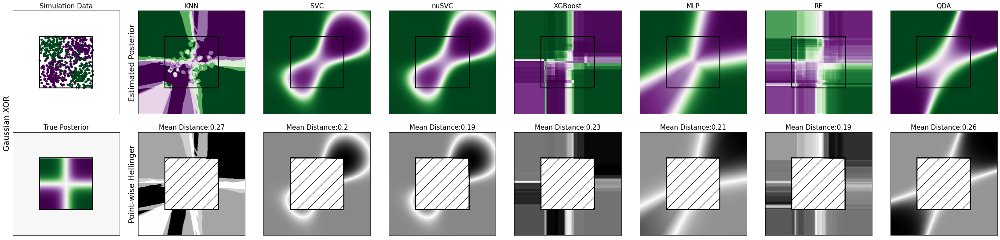

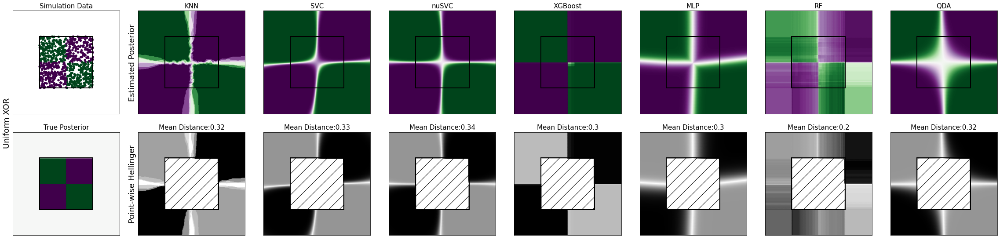

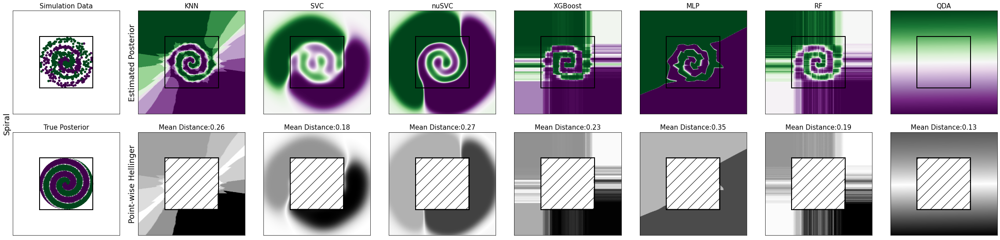

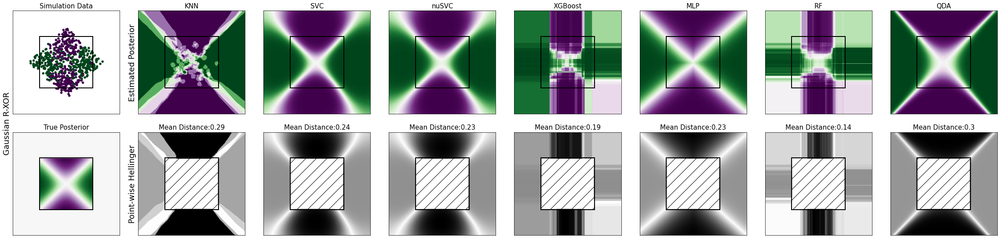

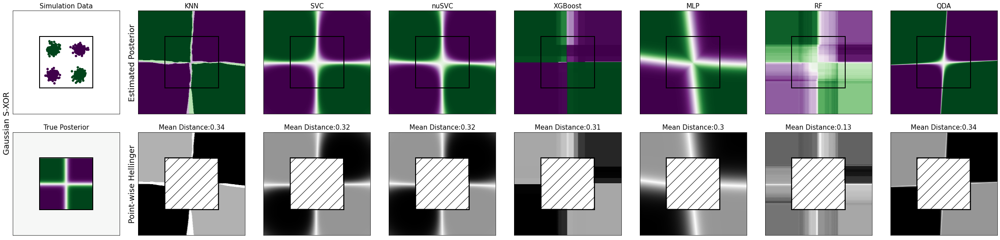

In [313]:
plot_posterior(h=0.01, enable=[0,0,0,1], savefile=True)

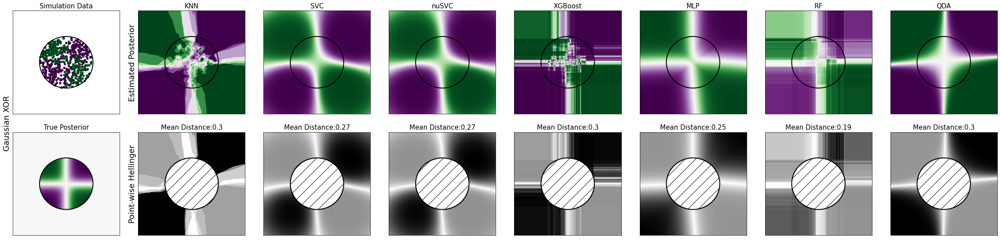

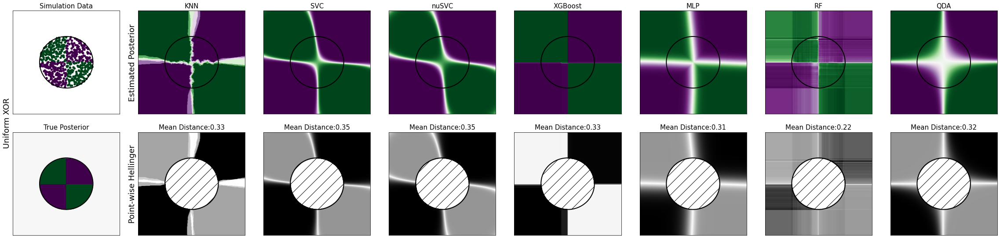

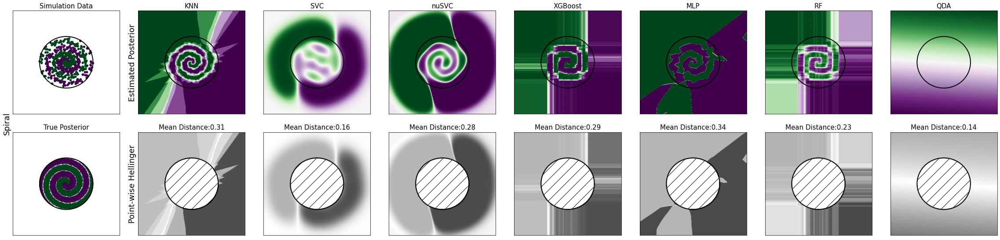

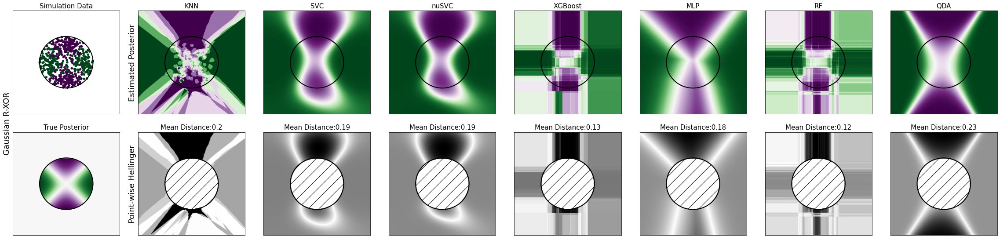

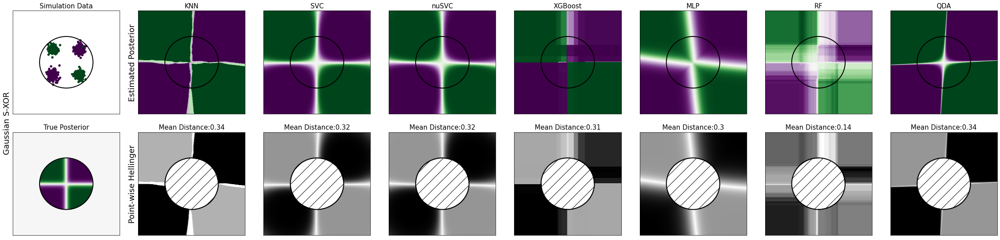

In [493]:
plot_posterior(h=0.01, enable=[0,0,0,1], cc=True, savefile=True)

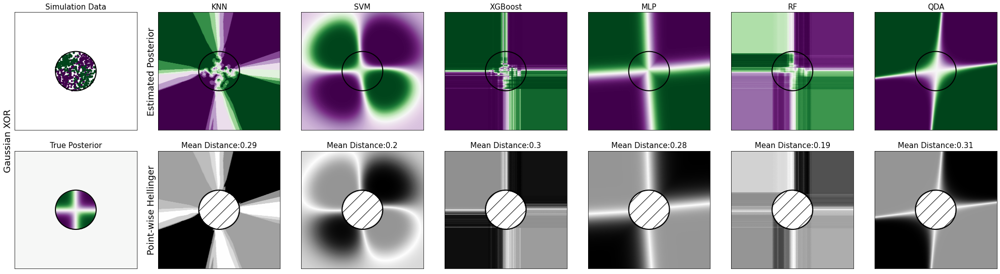

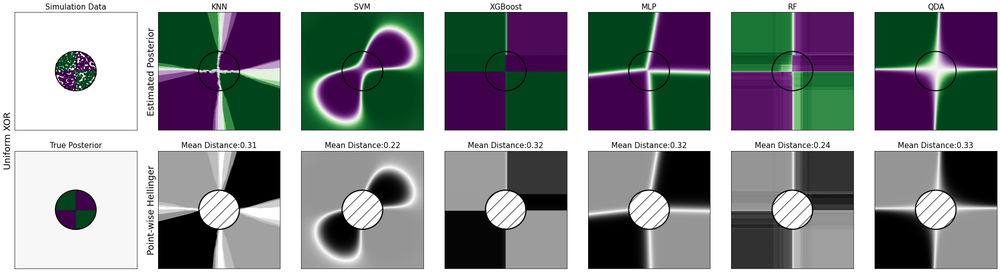

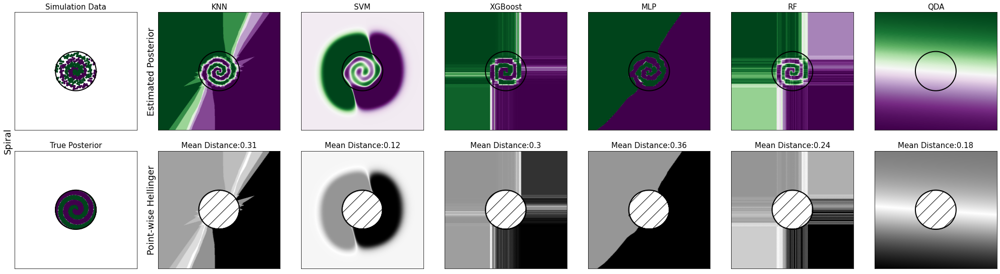

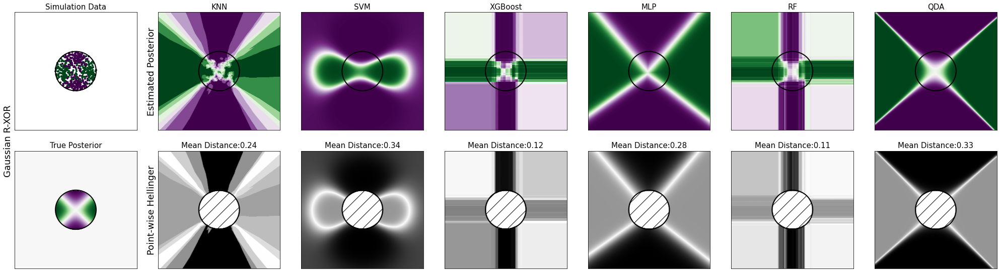

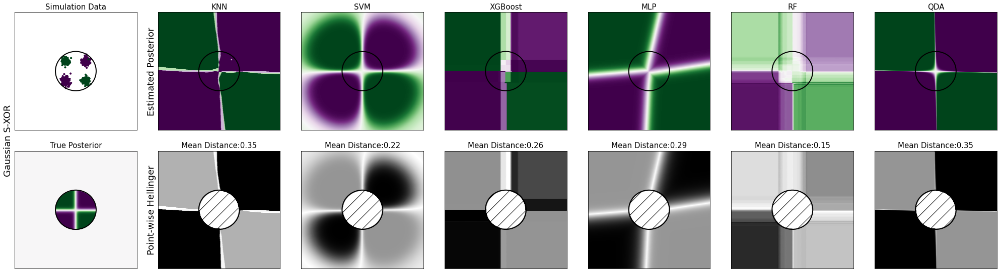

In [433]:
plot_posterior(h=0.01, enable=[0,0,0,1], cc=True, savefile=True)

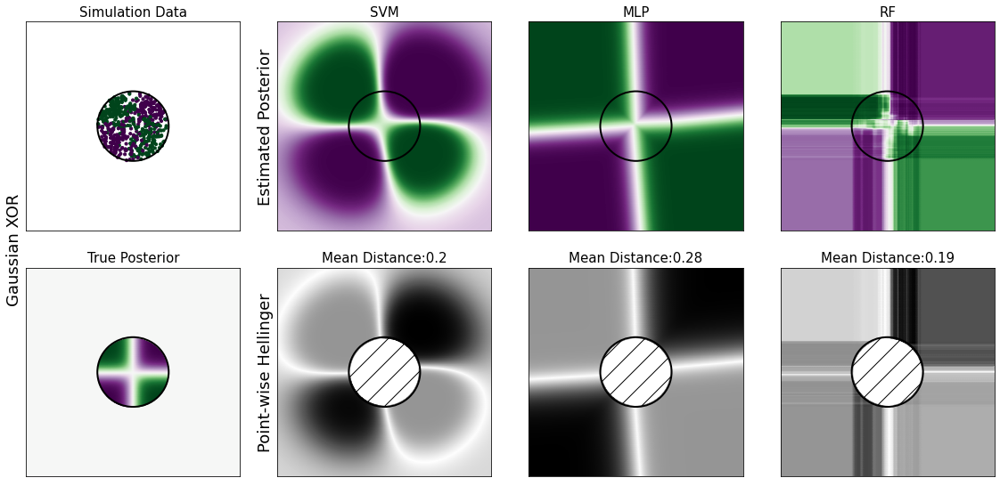

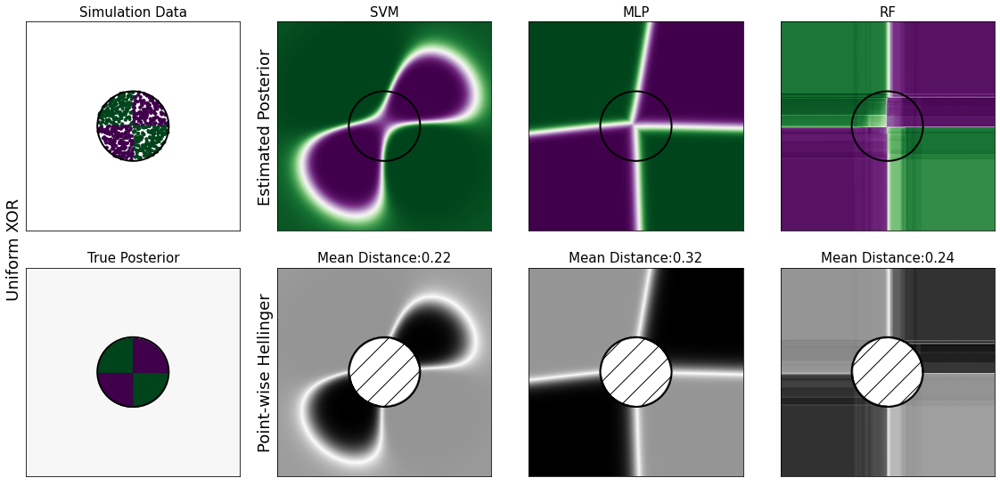

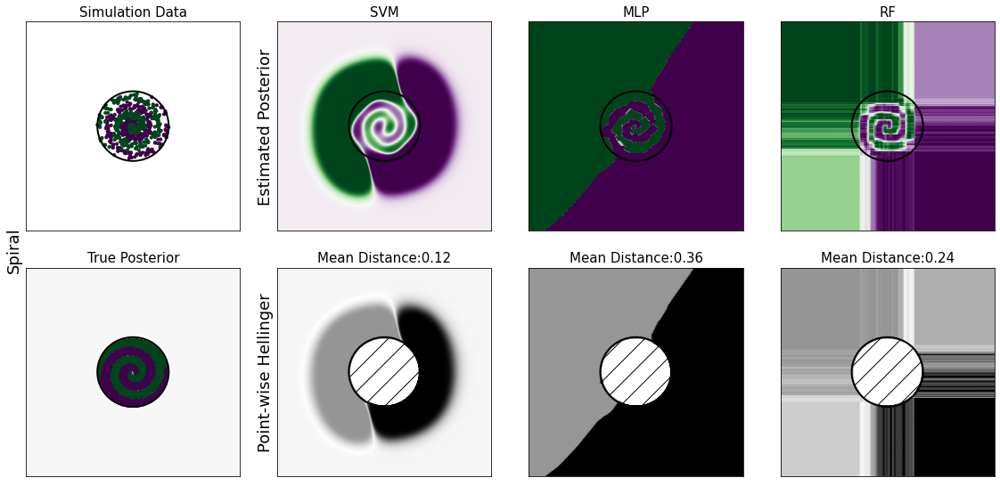

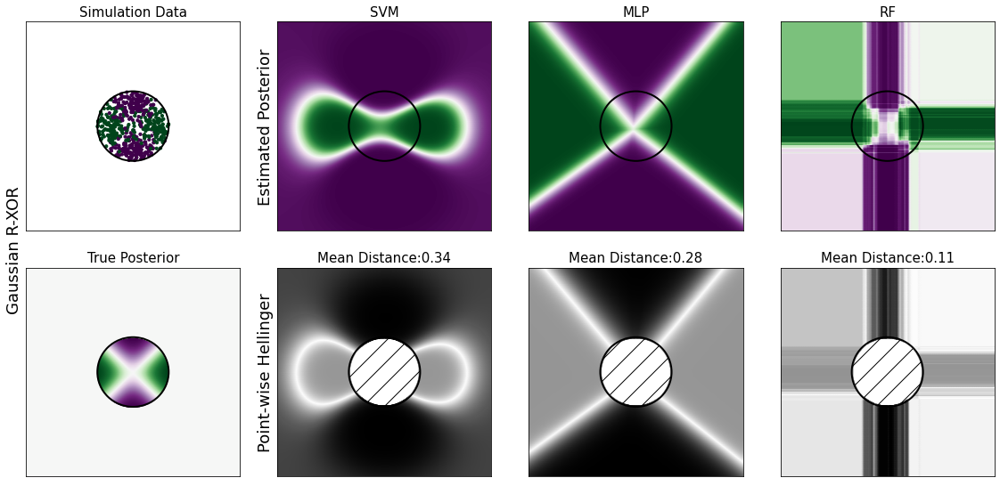

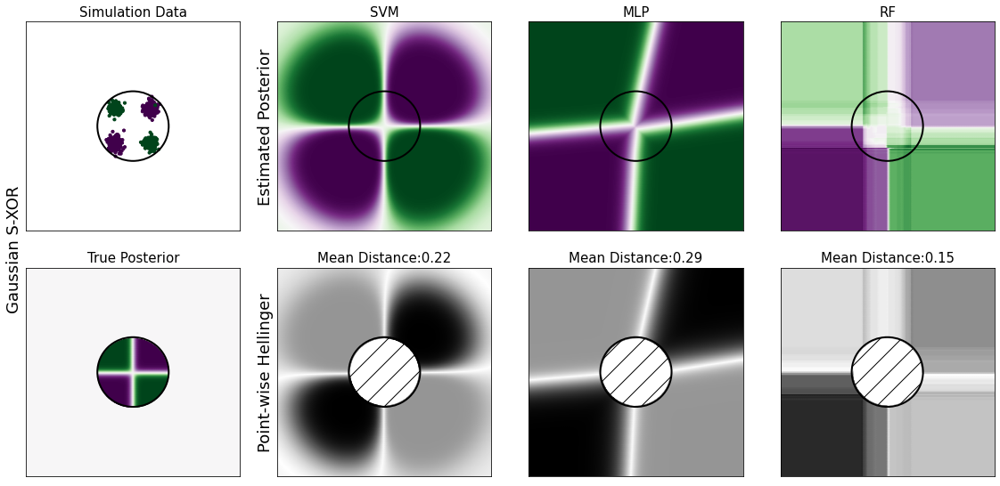

In [260]:
plot_posterior(h=0.01, enable=[0,0,0,1], cc=True, savefile=True)

## Model Parameters

In [328]:
for i in range(5):
    print('#'*70)
    print(data[i])
    print('#'*70)
    for j in range(7):
        print(select_clf(i)[j])

######################################################################
Gaussian XOR
######################################################################
KNeighborsClassifier(leaf_size=10)
SVC(gamma='auto', probability=True)
NuSVC(gamma='auto', probability=True)
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05263157894736842, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=256, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
MLPClassifier(alpha=0, hidden_layer_sizes=100, learning_rate_init=0.0001,
              max_iter=7000)
RandomForestClassifier(max_depth=9, n_esti

## Mean Helligner comparison

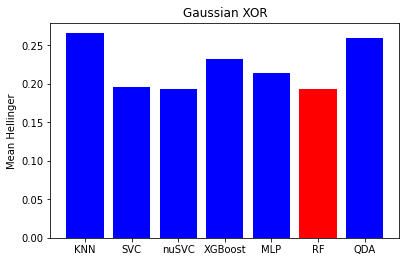

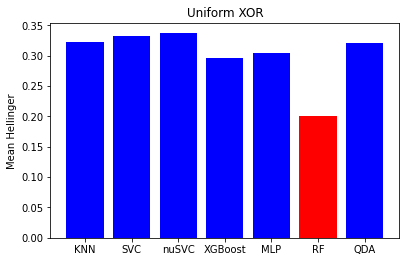

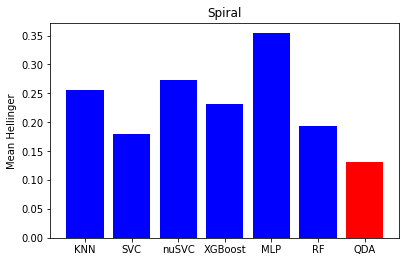

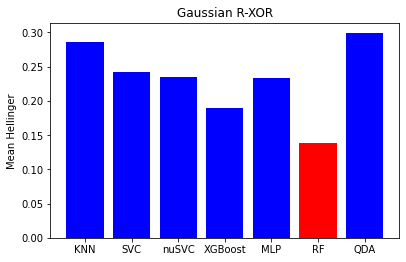

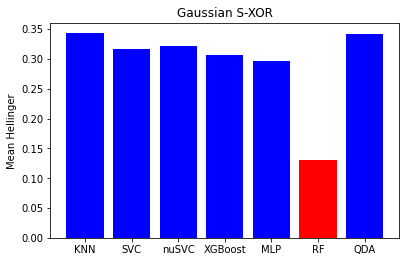

In [311]:
# fig, ax = plt.subplots(1,5, figsize=(7*5,4))
for j in range(5):
    score = []
    for i in range(7):
        score.append(OUT_hellinger[j][i].mean())

    color = np.zeros(7)#.astype(int)
    color[np.argmin(score)] = 1
    colors = ['blue' if i == 0 else 'red' for i in color]

    plt.figure()
    plt.bar(mods,score,color=colors)
    plt.ylabel('Mean Hellinger')
    plt.title(data[j]);
    path = 'figs/' + str(datetime.today())[:10] + '_' + data[j] + '_bar.png'# + '(' + str(h) + ')'
    plt.tight_layout(pad=2)
    plt.savefig(path, bbox='tight')

## Bar plots with CIRCULAR bbox

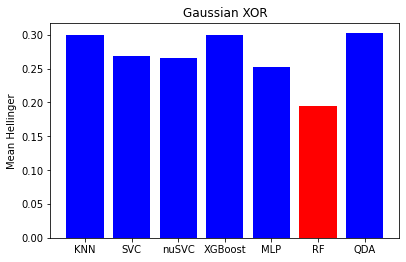

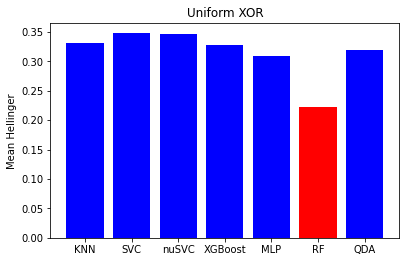

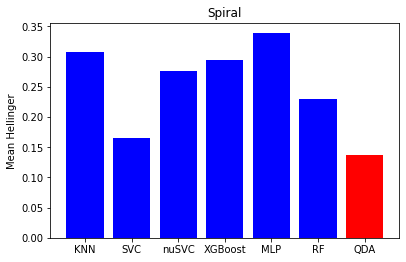

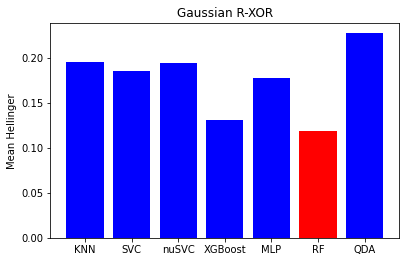

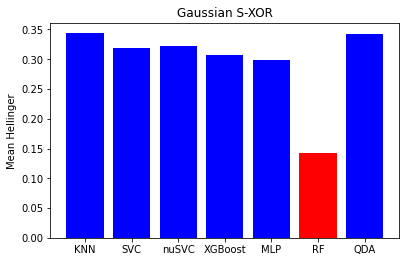

In [486]:
# fig, ax = plt.subplots(1,5, figsize=(7*5,4))
for j in range(5):
    score = []
    for i in range(7):
        score.append(COUT_hellinger[j][i].mean())

    color = np.zeros(7)#.astype(int)
    color[np.argmin(score)] = 1
    colors = ['blue' if i == 0 else 'red' for i in color]

    plt.figure()
    plt.bar(mods,score,color=colors)
    plt.ylabel('Mean Hellinger')
    plt.title(data[j]);
    path = 'figs/' + str(datetime.today())[:10] + '_' + data[j] + '_Cbar.png'# + '(' + str(h) + ')'
    plt.tight_layout(pad=2)
    plt.savefig(path, bbox='tight')

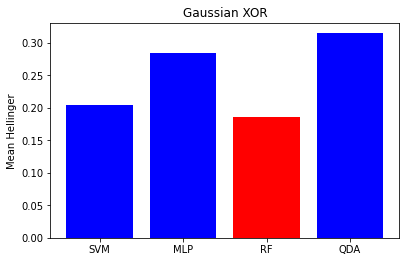

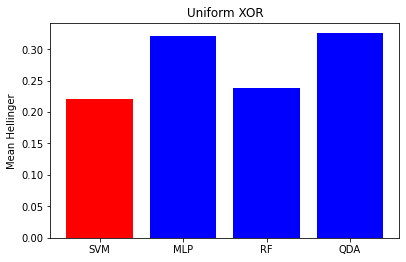

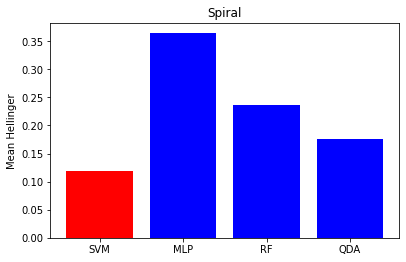

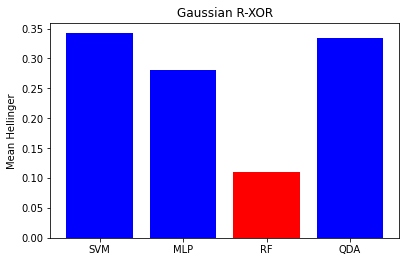

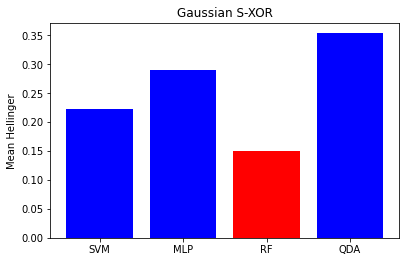

In [69]:
fig, ax = plt.subplots(1,5, figsize=(7*5,4))
for j in range(5):
    score = []
    for i in range(4):
        score.append(COUT_hellinger[j][i].mean())

    color = np.zeros(4)#.astype(int)
    color[np.argmin(score)] = 1
    colors = ['blue' if i == 0 else 'red' for i in color]

    # plt.figure()
    plt.bar(mods,score,color=colors)
    plt.ylabel('Mean Hellinger')
    plt.title(data[j]);
    path = 'figs/' + str(datetime.today())[:10] + '_' + data[j] + '_Cbar.png'# + '(' + str(h) + ')'
    plt.tight_layout(pad=2)
    plt.savefig(path, bbox='tight')

In [69]:
#sort posterior/hellinger distance by radial distance
filename = 'clf/avg6_0209_update.pickle'

bypass = True

pALL_rad, hALL_rad, iALL_rad = [], [], [] #posterior, hellinger, index

step = 0.01 #0.01
end  = 3
alpha = step * 0.5 # line vicinity (0.5)
rad = np.arange(0,end,step)
n = uX0.shape[0]
distC = np.sqrt(uX0**2 + uX1**2)
idx = np.arange(0,n)

if path.exists(filename) and bypass:
    with open(filename, 'rb') as f:
        pALL_rad, hALL_rad, iALL_rad, cout, cin = pickle.load(f, encoding='bytes')
    print('[', filename, '] loaded')

else: 
    pbar = tqdm(total=len(mods)*len(data)*rad.shape[0], desc='Main loop') 

    for d in range(len(data)): #dataset type
        pALL_rad.append([])
        hALL_rad.append([])
        iALL_rad.append([])

        for m in range(len(mods)): #model type
            pALL_rad[d].append([])
            hALL_rad[d].append([])
            iALL_rad[d].append([])
            distC = np.sqrt(uX0**2 + uX1**2)

            cin, cout = 0, 0

            for r in rad: #radius
                temp_distC = distC <= r
                tempidx = idx[temp_distC]
                distC[temp_distC] = 10. #prevent double counting
                pALL_rad[d][m].append(np.mean(Cpost[d][m][tempidx]))
                hALL_rad[d][m].append(np.mean(CWHOLE_hellinger[d][m][tempidx]))
                iALL_rad[d][m].append(tempidx)

                if r > 1: cout += tempidx.size
                else: cin += tempidx.size

                pbar.update(1)

    with open(filename, 'wb') as f:
        pickle.dump([pALL_rad, hALL_rad, iALL_rad, cout, cin], f)

print('\n' + '#'*20
+ '\n# outside: ' + str(cout)
+ '\n# inside:  ' + str(cin) + '\n' + '#'*20)

[ clf/avg6_0209_update.pickle ] loaded

####################
# outside: 249406
# inside:  31409
####################


In [70]:
distC[distC <= 1.0].size, distC[(distC > 1.0) * (distC <= 3.0)].size

(31409, 251282)

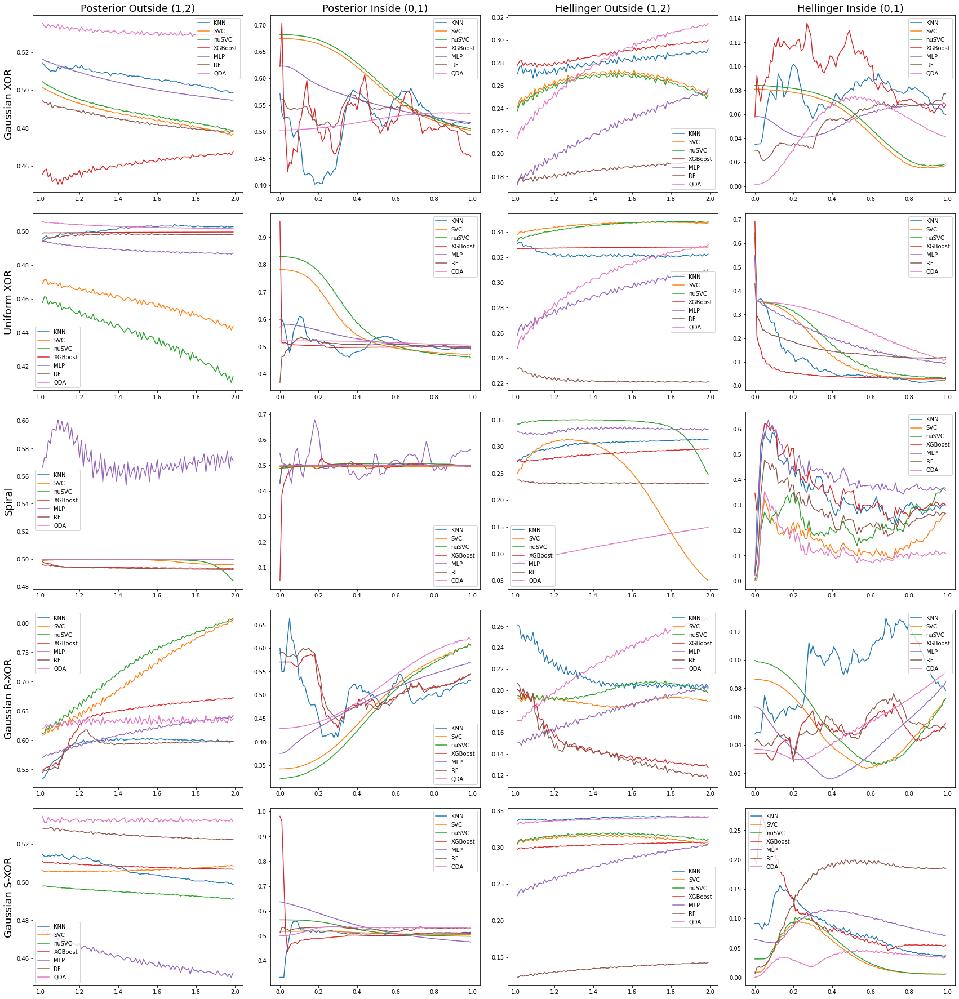

In [95]:
fig, ax = plt.subplots(len(data), 4, figsize=(6*4,5*5))

for i in range(len(data)):
    for ii, avgrad in enumerate([pOUT_rad, pIN_rad, hOUT_rad, hIN_rad]):
        for j in range(len(mods)):

            if i == 0:
                if ii == 0:
                    ax[i][ii].set_title('Posterior Outside (1,2)', fontsize=18)
                elif ii == 1:
                    ax[i][ii].set_title('Posterior Inside (0,1)', fontsize=18)
                elif ii == 2:
                    ax[i][ii].set_title('Hellinger Outside (1,2)', fontsize=18)
                elif ii == 3:
                    ax[i][ii].set_title('Hellinger Inside (0,1)', fontsize=18)

            if ii == 0:                
                ax[i][ii].set_ylabel(data[i], fontsize=18)

            if ii % 2 == 0:
                ax[i][ii].plot(rad[(rad > 1) * (rad < 2)], avgrad[i][j][101:200])
            else:
                ax[i][ii].plot(rad[rad < 1], avgrad[i][j][:100])
            
            ax[i][ii].legend(mods)

plt.tight_layout(pad=2)
plt.savefig('figs/radial_split.png', bbox='tight')

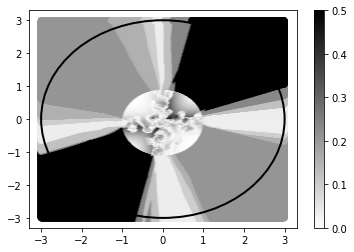

In [71]:
fig, ax = plt.subplots(1,1)
mlp = ax.scatter(uX0, uX1, c=CWHOLE_hellinger[0][0], cmap='binary')
ax.add_patch(Circle((0,0), radius=3, linewidth=2, edgecolor='k', fill=False))
plt.colorbar(mlp)

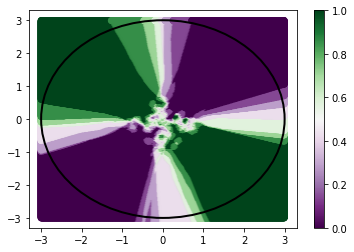

In [72]:
fig, ax = plt.subplots(1,1)
mlp = ax.scatter(uX0, uX1, c=Cpost[0][0], cmap=cmap)
ax.add_patch(Circle((0,0), radius=3, linewidth=2, edgecolor='k', fill=False))
plt.colorbar(mlp)

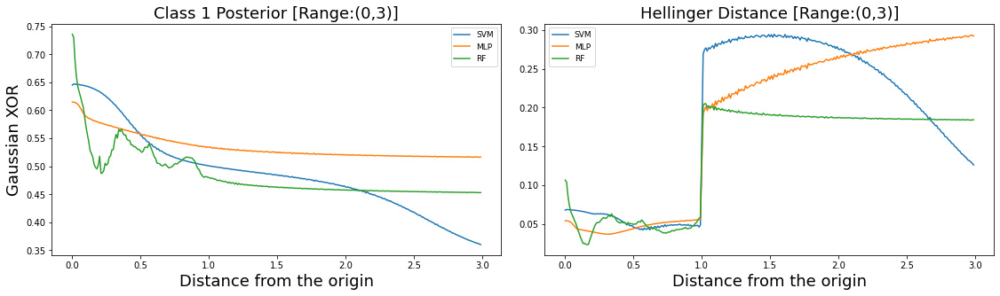

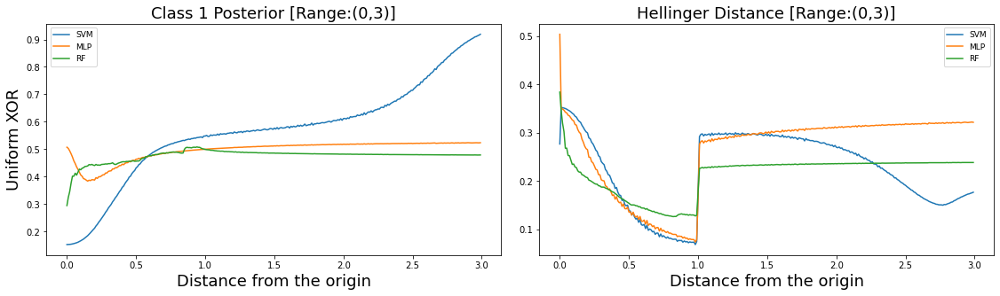

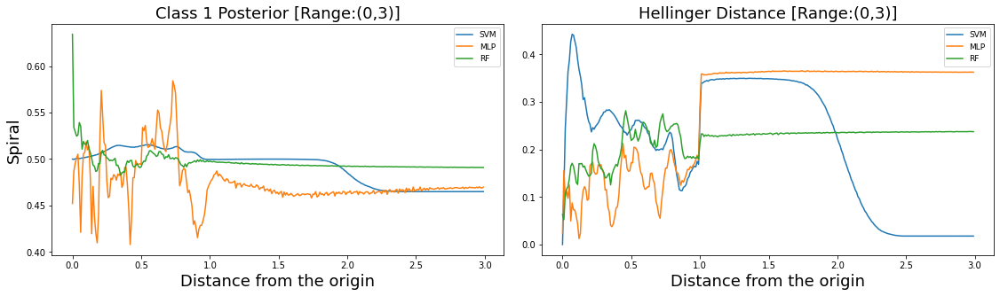

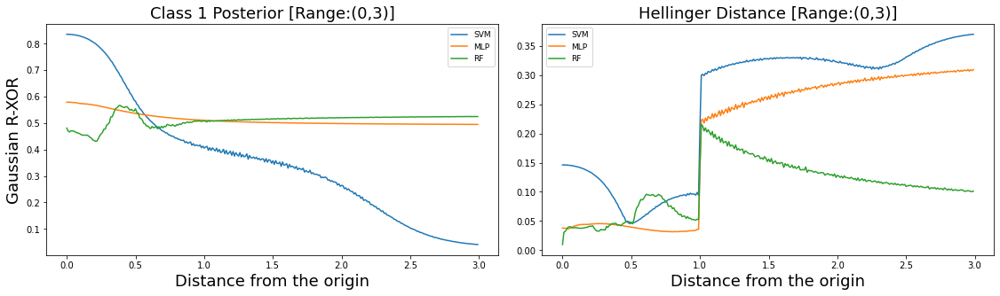

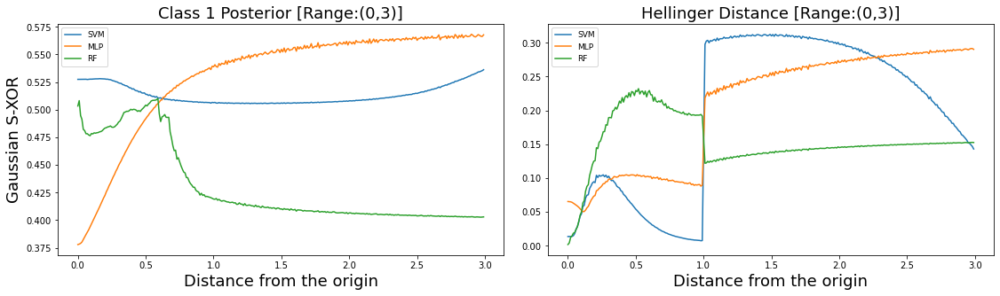

In [254]:
for i in range(len(data)):

    fig, ax = plt.subplots(1, 2, sharex=True, figsize=(4*4,5*1))

    for ii, avgrad in enumerate([pALL_rad, hALL_rad]):
        for j in range(len(mods)-1): #manually removing QDA
            
            if ii == 0:
                ax[ii].set_title('Class 1 Posterior [Range:(0,3)]', fontsize=18)
                ax[ii].set_ylabel(data[i], fontsize=18)
            else:
                ax[ii].set_title('Hellinger Distance [Range:(0,3)]', fontsize=18)

            ax[ii].plot(rad, avgrad[i][j]) # whole range            
            # ax[i][ii].axvline(x=1, linestyle='--', color='k') # conflicts with legend display
            ax[ii].set_xlabel('Distance from the origin', fontsize=18)
            ax[ii].legend(mods, prop={'size':9})

    plt.tight_layout(pad=2)
    plt.savefig('figs/radial_full_{}.png'.format(data[i]), bbox='tight')

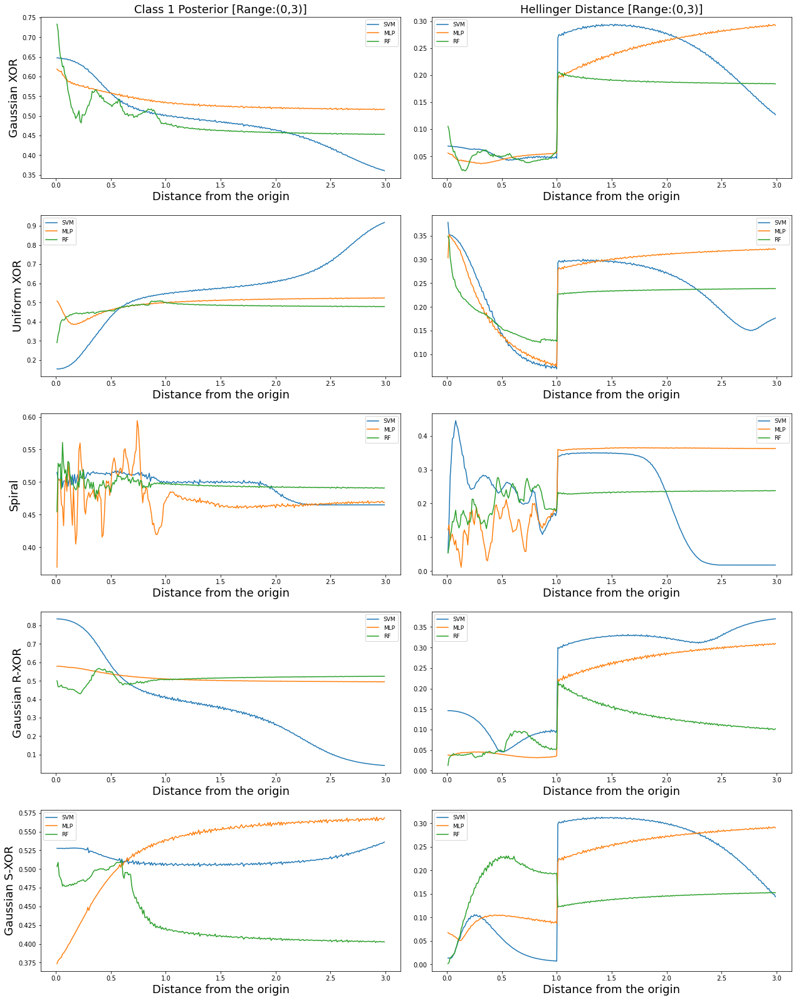

In [483]:
fig, ax = plt.subplots(len(data), 2, figsize=(18*1,4.5*5))

for i in range(len(data)):
    for ii, avgrad in enumerate([pALL_rad, hALL_rad]):
        for j in range(len(mods)-1): #manually removing QDA
            if i == 0 and ii == 0:
                ax[i][ii].set_title('Class 1 Posterior [Range:(0,3)]', fontsize=18)
                ax[i][ii].set_ylabel(data[i], fontsize=18)
            elif i == 0 and ii == 1:
                ax[i][ii].set_title('Hellinger Distance [Range:(0,3)]', fontsize=18)
            elif ii == 0:
                ax[i][ii].set_ylabel(data[i], fontsize=18)                

            ax[i][ii].plot(rad, avgrad[i][j]) # whole range            
            ax[i][ii].set_xlabel('Distance from the origin', fontsize=18)
            ax[i][ii].legend(mods, prop={'size':9})

plt.tight_layout(pad=2)
plt.savefig('figs/radial_full_all_1.png', bbox_inches='tight')

Text(0.5, 1.0, 'Hellinger(mean class1 posterior , 0.5) for outside of unit circle')

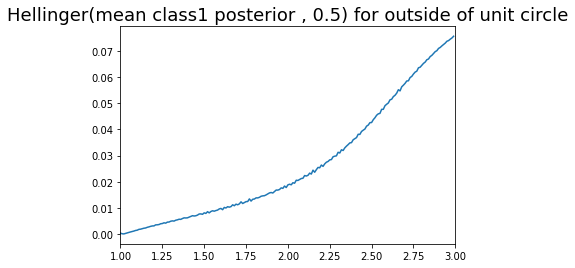

In [307]:
newh = []

for i in pALL_rad[0][0]:
    newh.append(hellinger(0.5, i))

plt.plot(rad, newh)
plt.xlim(1,3)
plt.title('Hellinger(mean class1 posterior , 0.5) for outside of unit circle', fontsize=18)

## MTurk Human data
On ML, [[2,4]] is [['Spiral, 'S-XOR']]

On human, it's the opposite

In [71]:
data

['Gaussian XOR', 'Uniform XOR', 'Spiral', 'Gaussian R-XOR', 'Gaussian S-XOR']

In [72]:
# load cleaned MTurk data
loadall = False

with open('dat/MTurk_ds.pickle', 'rb') as f:
    MT_ds = pickle.load(f)

if loadall:
    with open('dat/MTurk_ds_pilot.pickle', 'rb') as f:
        MT_ds_pilot = pickle.load(f)
    MT_ds = np.vstack((MT_ds, MT_ds_pilot))

In [73]:
#select by dataset ('est', 'real', 'mtype', 'x', 'd', 'y')
MT_2 = MT_ds[MT_ds[:,2] == 2] #S-XOR
MT_4 = MT_ds[MT_ds[:,2] == 4] #Spiral
MT_2[:,3].shape, MT_4[:,3].shape, MT_ds.shape

((6322,), (6276,), (12598, 7))

In [74]:
#compute hellinger distance between est and real
temp_d = hellinger_explicit(MT_2[:,0], MT_2[:,1])
MT_2 = np.column_stack((MT_2, temp_d))
MT_2[:,[6,7]] = MT_2[:,[7,6]]
# temp_d = abs(MT_4[:,0] - MT_4[:,1])
temp_d = hellinger_explicit(MT_4[:,0], MT_4[:,1])
MT_4 = np.column_stack((MT_4, temp_d))
MT_4[:,[6,7]] = MT_4[:,[7,6]]

MT_2.shape, MT_4.shape #'est', 'real', 'mtype', 'x', 'd', 'y', 'hellinger', 'id'

((6322, 8), (6276, 8))

In [75]:
MT_2[0]

array([0.53, 0.0, 2, 2.4, 3.189043743820395, 2.1, 0.51478150704935,
       '41299fc0-5a1b-4039-a652-e56271620ce0'], dtype=object)

In [76]:
#sort posterior/hellinger distance by radial distance

filename = 'clf/human_0209_update.pickle'

bypass = False

human_pALL_rad, human_hALL_rad, human_ipALL_rad, human_ihALL_rad = [], [], [], []
human_dat = [MT_2, MT_4]

step = 0.1
end  = 3
h_rad = np.arange(0,end,step)
alpha = step * 0.5 # line vicinity (0.5)
new_rad = []

if path.exists(filename) and bypass:
    with open(filename, 'rb') as f:
        human_pALL_rad, human_hALL_rad, human_iALL_rad, cout, cin = pickle.load(f, encoding='bytes')
    print('[', filename, '] loaded')

else: 
    for m in range(len(human_dat)): #model type
        human_pALL_rad.append([])
        human_hALL_rad.append([])
        human_ipALL_rad.append([])
        human_ihALL_rad.append([])
        new_rad.append([])

        n = human_dat[m].shape[0]
        distC = human_dat[m][:,4].copy() #euclidean distance
        idx = np.arange(0,n)

        cin, cout = 0, 0

        for r in h_rad: #radius

            temp_distC = distC <= r
            tempidx = idx[temp_distC]
            distC[temp_distC] = 10. #prevent double counting

            # tempidx = idx[np.all((distC <= r+alpha, distC >= r-alpha), axis=0)]
            if tempidx.size != 0:
                new_rad[m].append(r)
                human_pALL_rad[m].append(np.mean(human_dat[m][:,0][tempidx]))
                human_hALL_rad[m].append(np.mean(human_dat[m][:,6][tempidx]))
                human_ipALL_rad[m].append(human_dat[m][:,0][tempidx].astype(float))
                human_ihALL_rad[m].append(human_dat[m][:,6][tempidx].astype(float))

                if r > 1: cout += tempidx.size
                else: cin += tempidx.size

    with open(filename, 'wb') as f:
        pickle.dump([human_pALL_rad, human_hALL_rad, human_ipALL_rad, human_ihALL_rad, cout, cin], f)

print('\n' + '#'*20
+ '\n# outside: ' + str(cout)
+ '\n# inside:  ' + str(cin) + '\n' + '#'*20)


####################
# outside: 4025
# inside:  530
####################


In [77]:
human_pALL_rad[0][6]

0.4084313725490196

In [78]:
#actual number of samples (in, out)
MT_4[:,4][MT_4[:,4] <= 1].size, MT_4[:,4][(MT_4[:,4] > 1) * (MT_4[:,4] <= 3)].size

(530, 4340)

In [79]:
with open('clf/spiral_behavior.pickle', 'rb') as f:
    tempX, tempY, tempC = pickle.load(f, encoding='bytes')

In [80]:
 #'est', 'real', 'mtype', 'x', 'd', 'y', 'hellinger'
# MT_4[:,3]
# MT_4[:,5]
new_cor = np.column_stack([MT_4[:,3],MT_4[:,5]]).astype(float)
new_cor#, MT_4[:,3]
np.unique(new_cor, axis=0).shape

(3497, 2)

In [81]:
tempY.size

4489

In [82]:
Y_test = tempC.copy()
X_test = np.c_[(tempX,tempY)]
# newaxis = np.c_[(X,Y)]
newaxis1 = np.c_[(X_test,Y_test)]

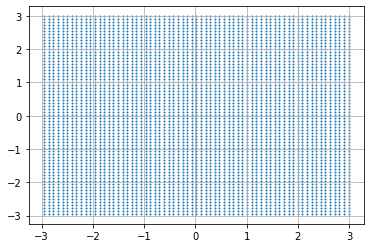

In [83]:
plt.scatter(newaxis1[:,0],newaxis1[:,1],s=1)
newaxis1[:,0].shape
plt.grid(True)

In [84]:
# fig, ax = plt.subplots(2, 2, figsize=(10*2,5*2))

# new_data = [data[4],data[2]]
    
# for j in range(2): #manually removing QDA
#     for ii, avgrad in enumerate([human_pALL_rad, human_hALL_rad]):
#         if j == 0 and ii == 0:
#             ax[j][ii].set_title('Human Prediction [Range:(0,2)]', fontsize=18)
#         elif j == 0 and ii == 1:
#             ax[j][ii].set_title('Hellinger Distance [Range:(0,2)]', fontsize=18)

#         if ii == 0:
#             ax[j][ii].set_ylabel(new_data[j], fontsize=18)

#         ax[j][ii].plot(new_rad[j], avgrad[j]) # whole range

# plt.tight_layout(pad=2)
# plt.savefig('figs/human_graph.png', bbox_inches='tight')

In [85]:
data

['Gaussian XOR', 'Uniform XOR', 'Spiral', 'Gaussian R-XOR', 'Gaussian S-XOR']

In [86]:
# new_rad[0], human_iALL_rad[0][0]
human_new = []
human_p = []
human_h = []
human_i = []
a, b = [], []
for j in range(2):
    # human_new.append([[],[]])
    human_p.append([])
    human_h.append([])
    human_i.append([])
    for i, idx in enumerate(new_rad[j]):
        n = human_ihALL_rad[j][i].size
        human_h[j] += list(human_ihALL_rad[j][i])
        human_p[j] += list(human_ipALL_rad[j][i])
        human_i[j] += [idx]*n
    # human_iALL_rad_lin.append([[idx]*n, list(human_iALL_rad[0][i])])

In [87]:
len(human_i[0])

4639

c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp\project_bias\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp\project_bias\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\Users\jongm\Desktop\temp_workspace\Python\JOVO\induced_bias_exp\project_bias\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional a

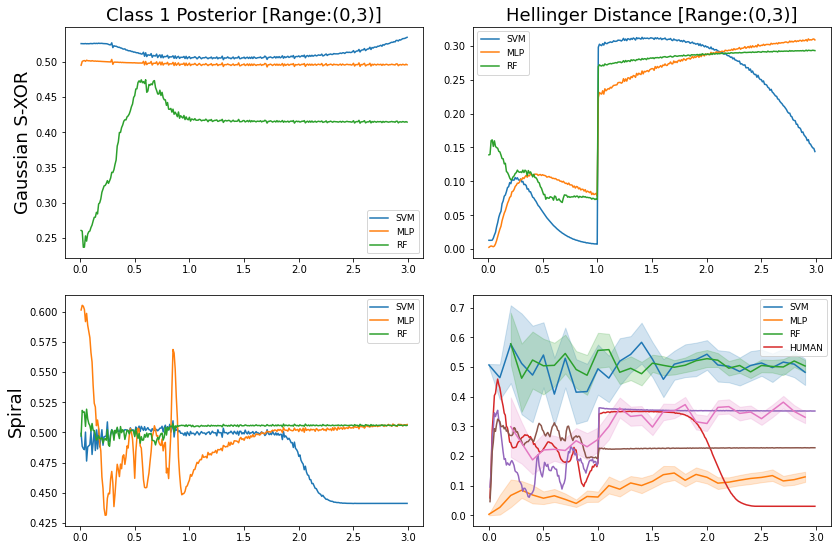

In [88]:
new_data = [data[4],data[2]]
new_mods = mods[:3] + ['HUMAN']

fig, ax = plt.subplots(len(new_data), 2, figsize=(4*3,4*2))

for i, k in enumerate([4,2]):
    for ii, avgrad in enumerate([pALL_rad, hALL_rad]):
        for j in range(len(new_mods)-1): 

            if i == 0:
                if ii == 0:
                    ax[i][ii].set_title('Class 1 Posterior [Range:(0,3)]', fontsize=18)
                elif ii == 1:
                    ax[i][ii].set_title('Hellinger Distance [Range:(0,3)]', fontsize=18)

            if ii == 0:
                ax[i][ii].set_ylabel(new_data[i], fontsize=18)

            ax[i][ii].plot(rad, avgrad[k][j]) # whole range

        
        # adding human
        # ax[i][ii] = sns.lineplot(new_rad[i], [human_ipALL_rad, human_ihALL_rad][ii][i]) # different radius range
        # ax[i][ii] = 
        sns.lineplot(human_i[i], [human_p, human_h][ii][i]) # different radius range
        ax[i][ii].legend(new_mods, prop={'size':9})

plt.tight_layout(pad=2)
fig.savefig(f'figs/{datetime.now().date()}_radial_all_corrected.png', bbox_inches='tight')

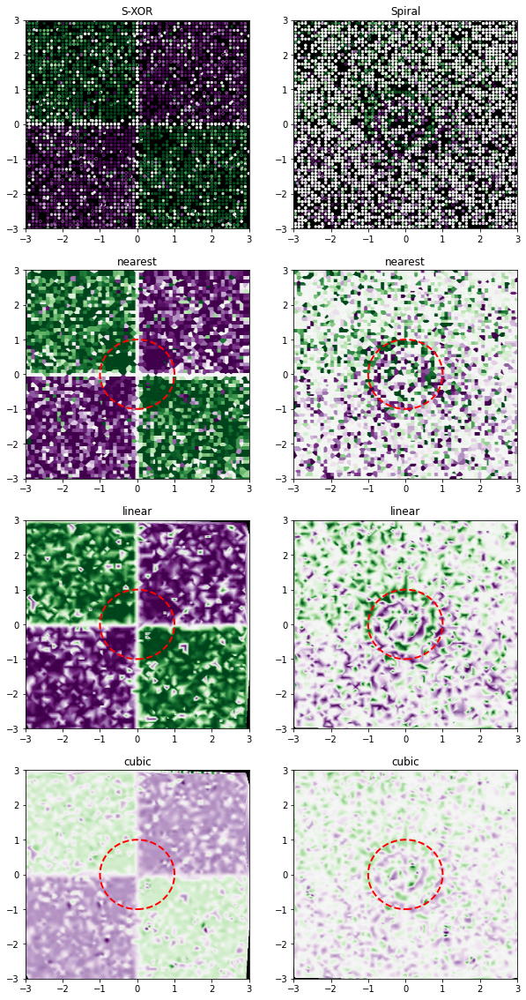

In [89]:
from scipy.interpolate import griddata

method = ['nearest', 'linear', 'cubic']
rng = 3

fig, ax = plt.subplots(4,2, figsize=(5*2,5*4))

for f in range(4):
    if f == 0:
        ax[f,0].scatter(MT_2[:,3],MT_2[:,5], c=MT_2[:,0], cmap='PRGn',s=5)
        ax[f,0].set_facecolor('k')
        ax[f,1].scatter(MT_4[:,3],MT_4[:,5], c=MT_4[:,0], cmap='PRGn',s=5)
        ax[f,1].set_facecolor('k')
        ax[f,0].set_title('S-XOR')
        ax[f,1].set_title('Spiral')
    # elif f == 3:
    else:
        grid_near = griddata((MT_2[:,3], MT_2[:,5]), MT_2[:,0], (uX0,uX1), method=method[f-1], rescale=False)
        ax[f,0].scatter(uX0,uX1, c=grid_near, cmap='PRGn',s=1)#, axisbg='black'
        ax[f,0].set_facecolor('k')
        ax[f,0].add_patch(Circle((0,0), radius=1, linewidth=2, ls='--',edgecolor='r', fill=False))
        
        grid_near = griddata((MT_4[:,3], MT_4[:,5]), MT_4[:,0], (uX0,uX1), method=method[f-1], rescale=True)
        ax[f,1].scatter(uX0,uX1, c=grid_near, cmap='PRGn',s=1)
        ax[f,1].set_facecolor('k')
        ax[f,1].add_patch(Circle((0,0), radius=1, linewidth=2, ls='--',edgecolor='r', fill=False))

        ax[f,0].set_title(method[f-1])
        ax[f,1].set_title(method[f-1])

    ax[f,0].set_xlim([-rng,rng])
    ax[f,0].set_ylim([-rng,rng])
    ax[f,1].set_xlim([-rng,rng])
    ax[f,1].set_ylim([-rng,rng])
if loadall:
    plt.savefig(f'figs/{datetime.now().date()}_human_interpolation_all.png', bbox_inches='tight')
else:
    plt.savefig(f'figs/{datetime.now().date()}_human_interpolation_nopilot.png', bbox_inches='tight')
# plt.close('all')

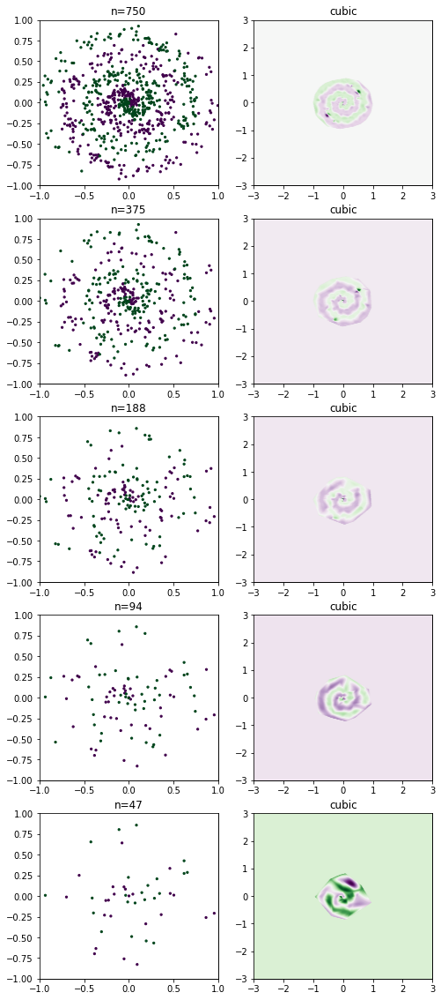

In [1116]:
X1, X2, y = [],[],[]

for i in range(dsetnum):
    if True:
        X, tempy, _, _ = select_dataset(i, cc=True)
    else:
        X, tempy, _, _ = select_dataset(i)
    y.append(tempy)
    X1.append(X[:,0])
    X2.append(X[:,1])

method = 'cubic'

cnt = 0
fig, axs = plt.subplots(5,2, figsize=(4*2,4*5))
plt.setp(axs, xticks=[], yticks=[])
for i, n in enumerate([1,2,4,8,16]):    #1,2,4,8,16
    cnt += 1
    axs = fig.add_subplot(5,2,cnt)
    axs.scatter(X1[2][::n],X2[2][::n],c=y[2][::n], s=5, cmap=cmap)
    axs.set_title('n={}'.format(y[2][::n].size))
    plt.setp(axs, xlim=[-1,1], ylim=[-1,1])

    cnt += 1
    axs = fig.add_subplot(5,2,cnt)
    grid_near = griddata((X1[2][::n],X2[2][::n]),y[2][::n], (uX0,uX1), method=method, fill_value=0.5, rescale=True)
    axs.scatter(uX0,uX1, c=grid_near, cmap='PRGn',s=1)
    axs.set_title(method)
    plt.setp(axs, xlim=[-3,3], ylim=[-3,3])

filename = 'figs/' + str(datetime.today())[:10] + '_interpolation.png'

plt.savefig(filename, bbox_inches='tight')

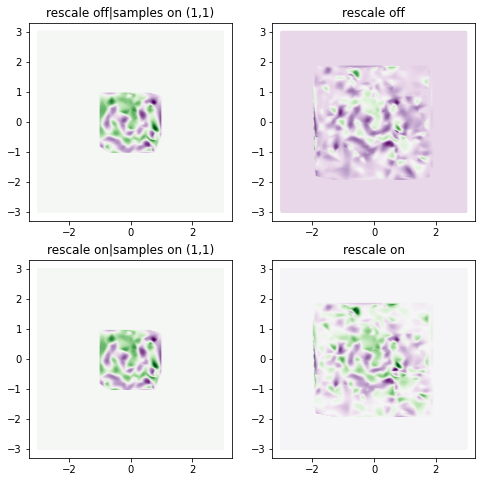

In [1155]:
# MT_4[:,0]

MT = MT_4

temp_idx_3 = (MT[:,3] <= 1) * (MT[:,3] >= -1)
temp_idx_5 = (MT[:,5] <= 1) * (MT[:,5] >= -1)
temp_idx = temp_idx_3 * temp_idx_5

# (MT_4[:,3] <= 1 * MT_4[:,3] >= -1)
fig, axs = plt.subplots(2,2, figsize=(4*2,4*2))
grid_near = griddata((MT[:,3][temp_idx],MT[:,5][temp_idx]),MT[:,0][temp_idx], (uX0,uX1), method=method, fill_value=0.5, rescale=False)
axs[0,0].scatter(uX0,uX1, c=grid_near, cmap='PRGn',s=1)
axs[0,0].set_title('rescale off|samples on (1,1)')

grid_near = griddata((MT[:,3][:],MT[:,5][:]),MT[:,0][:], (uX0,uX1), method=method, fill_value=0.5, rescale=False)
axs[0,1].scatter(uX0,uX1, c=grid_near, cmap='PRGn',s=1)
axs[0,1].set_title('rescale off')

grid_near = griddata((MT[:,3][temp_idx],MT[:,5][temp_idx]),MT[:,0][temp_idx], (uX0,uX1), method=method, fill_value=0.5, rescale=True)
axs[1,0].scatter(uX0,uX1, c=grid_near, cmap='PRGn',s=1)
axs[1,0].set_title('rescale on|samples on (1,1)')

grid_near = griddata((MT[:,3][:],MT[:,5][:]),MT[:,0][:], (uX0,uX1), method=method, fill_value=0.5, rescale=True)
axs[1,1].scatter(uX0,uX1, c=grid_near, cmap='PRGn',s=1)
axs[1,1].set_title('rescale on')

filename = 'figs/' + str(datetime.today())[:10] + '_interpolation_rescale.png'

plt.savefig(filename, bbox_inches='tight')

In [106]:
#number of sample simulator
for rngs in [2,3]: #simulating r=2 and r=3

    lst_cnt = [] #count list
    rng = rngs

    for i in range(10):

        temp = np.round(generate_mask(l=-rng, r=rng, h=0.1),2) #must round!
        tempx, tempy= temp[:,0], temp[:,1]

        temp_idx = (np.sqrt(temp[:,0]**2 + temp[:,1]**2) <= 1)#(abs(tempx) <= 1) * (abs(tempy) <= 1.0)
        temp_circle = temp[temp_idx]
        tempz = np.arange(0,temp_circle.shape[0])
        tempz[:] = 0
        # print (temp_circle.shape, tempz.shape)

        cnt_t = 0 #total count
        cnt_i = 0 #inside count    

        while True: #ensures sampling within the unit circle
            chooseX = np.random.choice(tempx)
            chooseY = np.random.choice(tempy)
            cnt_t += 1
            # print(idx)
            if cnt_t == 20000: #safety switch
                break
            if np.sqrt(chooseX**2+chooseY**2) <= 1:
                idx = np.argwhere(np.all(temp_circle==[chooseX,chooseY], axis=1))
                tempz[idx] = 1
                cnt_i += 1
                if tempz.sum() > tempz.size * 0.8:
                    break
        
        lst_cnt.append((cnt_t, cnt_i, tempz.sum(), tempz.size, tempx.size))

    print('Range {}: {}'.format(rng, np.mean(lst_cnt, axis=0)))    

Range 2: [2615.2  518.5  254.   317.  1600. ]
Range 3: [5643.7  494.8  254.   317.  3600. ]


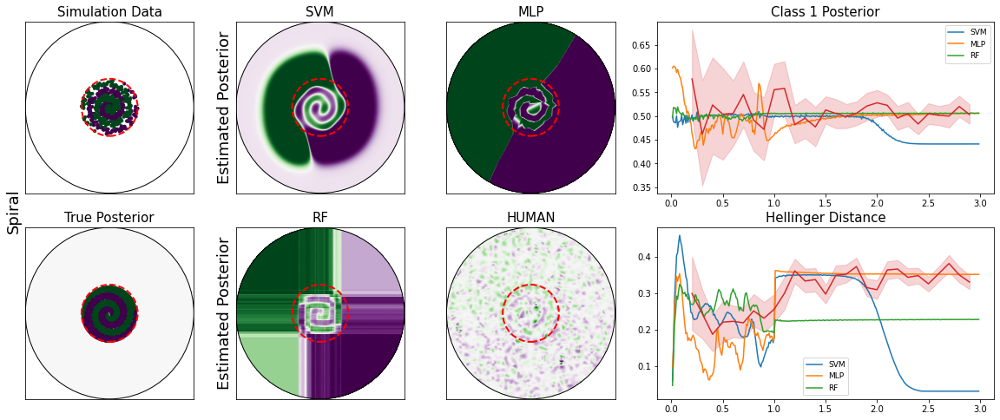

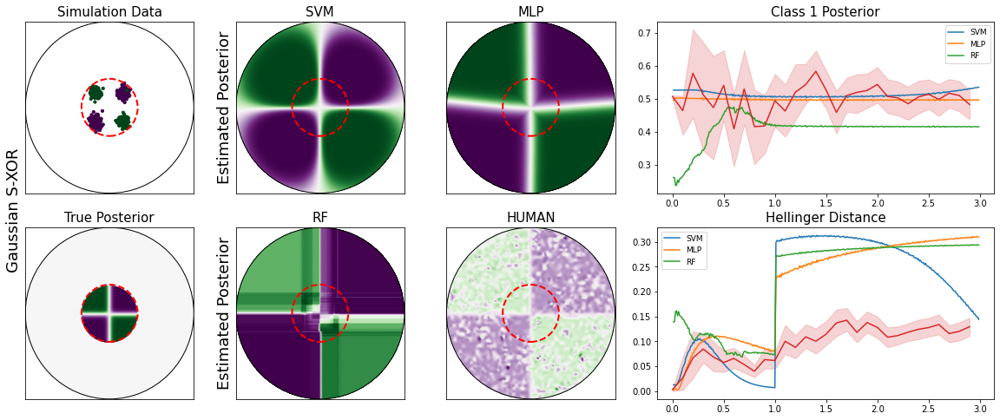

In [98]:
plot_posterior(h=0.01, enable=[0,0,0,0,1], cc=True, savefile=False)

In [148]:
#['est', 'real', 'mtype', 'x', 'd', 'y', 'hellinger', 'id']

['Gaussian XOR', 'Uniform XOR', 'Spiral', 'Gaussian R-XOR', 'Gaussian S-XOR']

In [293]:
df_MT2 = pd.DataFrame(MT_2, columns=['est', 'real', 'mtype', 'x', 'd', 'y', 'hellinger', 'id', 'hellinger'])#.query('real == 0')
df_MT4 = pd.DataFrame(MT_4, columns=['est', 'real', 'mtype', 'x', 'd', 'y', 'hellinger', 'id', 'hellinger'])#.query('real == 0')
df_MT2

,est,real,mtype,x,d,y,hellinger,id,hellinger
0,0.53,0,2,2.4,3.18904,2.1,0.514782,41299fc0-5a1b-4039-a652-e56271620ce0,0.514782
1,0.25,8.31528e-07,2,1.5,1.65529,0.7,0.352909,41299fc0-5a1b-4039-a652-e56271620ce0,0.352909
2,0.5,1.52677e-08,2,1.2,1.5,0.9,0.499913,41299fc0-5a1b-4039-a652-e56271620ce0,0.499913
3,0.75,1,2,2.1,2.9,-2,0.0947343,41299fc0-5a1b-4039-a652-e56271620ce0,0.0947343
4,0.71,1,2,-2.8,3.62353,2.3,0.111288,41299fc0-5a1b-4039-a652-e56271620ce0,0.111288
...,...,...,...,...,...,...,...,...,...
6317,0.95,0.997527,2,-2.7,2.71662,0.3,0.0170296,54806146-855d-4038-afd0-d0578230fb09,0.0170296
6318,0.1,0,2,2.7,3.54683,2.3,0.223607,54806146-855d-4038-afd0-d0578230fb09,0.223607
6319,0.09,0.00247262,2,-0.3,1.82483,-1.8,0.176971,54806146-855d-4038-afd0-d0578230fb09,0.176971
6320,0.96,1,2,-1.1,2.54951,2.3,0.0142865,54806146-855d-4038-afd0-d0578230fb09,0.0142865


## calculating variance

In [289]:
#user variance calculation
#'est', 'real', 'mtype', 'x', 'd', 'y', 'hellinger', 'id'
df_var = []

for j, MT in enumerate([MT_2, MT_4]):
    df_var.append([])
    for i, dat in enumerate(pd.DataFrame(MT).groupby(7)):
        # print(f'{i}: {dat[1][4].mean()}')    
        # print(f'{i}: {dat[1][4].var()}')
        temp = dat[1]
        temp = temp[temp[1] < 0.5][4]
        # df_var[j].append(dat[1][4].std())
        df_var[j].append(temp.std())
        # df_var[j].append([dat[1][dat[1].iloc[1] == 0][4].std(),
        #                     dat[1][4].std()])
    # break

for j, MT in enumerate([MT_2, MT_4]):
    df_var.append([])
    for i, dat in enumerate(pd.DataFrame(MT).groupby(7)):
        # print(f'{i}: {dat[1][4].mean()}')    
        # print(f'{i}: {dat[1][4].var()}')
        temp = dat[1]
        temp = temp[temp[1] < 0.5][4]
        df_var[j+2].append(temp.mean())
        # df_var[j+2].append(dat[1][4].mean())

df_var = pd.DataFrame(df_var)
df_var.index = ['SXOR-var','spiral-var','SXOR-mean','spiral-mean']
df_var

,0,1,2,3,4,5,6,7,8,9,...,116,117,118,119,120,121,122,123,124,125
SXOR-var,0.997606,0.738693,1.002709,0.720634,0.695097,0.792659,0.943136,0.919470,0.760993,0.904275,...,0.769888,0.750483,0.860342,0.789872,1.043056,0.927589,0.775609,0.685979,0.876138,0.925177
spiral-var,0.873253,0.911934,0.807810,0.831820,0.697894,0.676121,0.819075,0.806768,0.902451,0.888162,...,0.854371,1.024503,0.818744,0.641368,0.700957,0.803887,0.713967,0.969135,0.863439,0.807333
SXOR-mean,1.712897,2.457767,2.083492,2.342844,2.221459,2.251763,2.266250,2.073125,2.535999,2.196141,...,2.264603,2.409375,2.594176,2.022014,2.133560,2.229883,2.314216,2.099377,2.484057,2.288423
spiral-mean,2.127363,2.165158,2.204173,2.482469,2.330324,2.297401,2.514138,2.401898,2.348475,2.219775,...,2.204378,2.370583,2.485824,2.320958,2.201197,2.152108,2.450285,2.233175,2.316302,2.106866


In [238]:
#'est', 'real', 'mtype', 'x', 'd', 'y', 'hellinger', 'id'


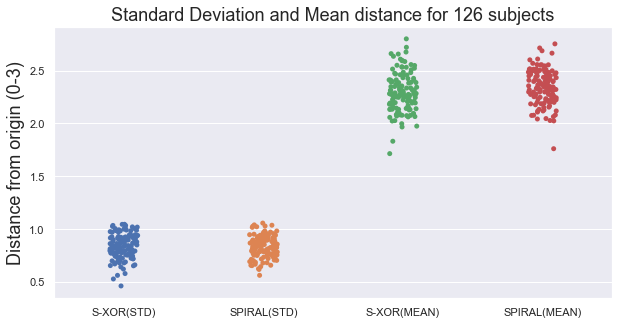

In [290]:
df_var.index = ['S-XOR(STD)','SPIRAL(STD)','S-XOR(MEAN)','SPIRAL(MEAN)']
f = plt.figure(figsize=(5*2,5*1))

sns.stripplot(data=df_var.T)
plt.title('Standard Deviation and Mean distance for 126 subjects', fontsize=18)
plt.ylabel('Distance from origin (0-3)', fontsize=18)

f.savefig(f'figs/{datetime.today().date()}_std_strip.png', bbox_inches='tight')

S-XOR     0.033090
SPIRAL    0.034677
dtype: float64


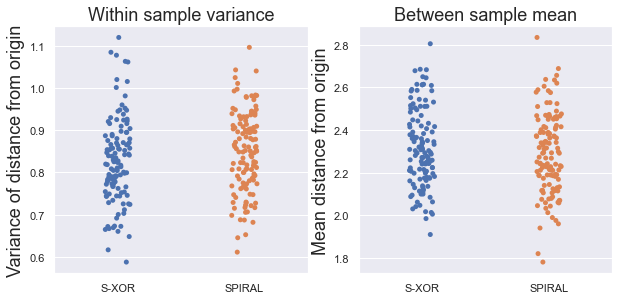

In [288]:
df_var.index = ['S-XOR','SPIRAL','S-XOR','SPIRAL']

f = plt.figure(figsize=(5*2,5*2))
gs = f.add_gridspec(2, 2)

ax = f.add_subplot(gs[0, 0])
sns.stripplot(data=df_var.iloc[:2,:].T, ax=ax)
ax.set_title('Within sample variance', fontsize=18)
ax.set_ylabel('Variance of distance from origin', fontsize=18)

ax = f.add_subplot(gs[0, 1])
sns.stripplot(data=df_var.iloc[2:,:].T, ax=ax)
ax.set_title('Between sample mean', fontsize=18)
ax.set_ylabel('Mean distance from origin', fontsize=18)

f.savefig(f'figs/{datetime.today().date()}_variance_strip.png', bbox_inches='tight')

print(df_var.iloc[2:,:].T.var())

## Calculate variance of response wrt distance from origin

In [305]:
#'est', 'real', 'mtype', 'x', 'd', 'y', 'hellinger', 'id', 'hellinger'
df_MT2 = df_MT2.join(pd.DataFrame(abs(df_MT2['est'] - df_MT2['real']), columns=['delR']))
df_MT4 = df_MT4.join(pd.DataFrame(abs(df_MT4['est'] - df_MT4['real']), columns=['delR']))

# for i in df_MT2.groupby('id'):


In [318]:
tempdf = df_MT2[['id', 'd', 'delR']]
tempdf['d'] = tempdf['d'].astype(float)
tempdf['delR'] = tempdf['delR'].astype(float)

In [440]:
# 0.0 - 3.0
nseg = 0.3
seg = np.arange(0,3.01,nseg)
print(seg)
df_var_d = []

for m, MT in enumerate([df_MT2, df_MT4]):
    df_var_d.append([])
    tempdf = MT[['id', 'd', 'delR']]
    tempdf['d'] = tempdf['d'].astype(float)
    tempdf['delR'] = tempdf['delR'].astype(float)

    for i in range(seg.shape[0]-1):
        df_var_d[m].append([])
        for dat in tempdf.groupby('id'):
            temp = dat[1].query(f'd >= {seg[i]} and d < {seg[i+1]}')
            df_var_d[m][i].append(temp['delR'].mean())

[0.  0.3 0.6 0.9 1.2 1.5 1.8 2.1 2.4 2.7 3. ]


In [417]:
lblseg = [f'{round(seg[i],2)}-{round(seg[i+1],2)}' for i in range(seg.shape[0]-1)]
lblseg

['0.0-0.3',
 '0.3-0.6',
 '0.6-0.9',
 '0.9-1.2',
 '1.2-1.5',
 '1.5-1.8',
 '1.8-2.1',
 '2.1-2.4',
 '2.4-2.7',
 '2.7-3.0']

In [442]:
df_var_d0 = pd.DataFrame(df_var_d[0]).T
df_var_d1 = pd.DataFrame(df_var_d[1]).T
df_var_d0.columns = lblseg
df_var_d1.columns = lblseg

df_var_d0

,0.0-0.3,0.3-0.6,0.6-0.9,0.9-1.2,1.2-1.5,1.5-1.8,1.8-2.1,2.1-2.4,2.4-2.7,2.7-3.0
0,NaN,4.295646e-02,0.314604,0.000031,4.157666e-07,0.004509,0.000006,0.001435,2.980227e-02,0.002067
1,NaN,7.000000e-02,NaN,0.010797,8.549207e-02,0.239998,0.202001,0.173399,7.866032e-02,0.095730
2,NaN,1.050670e-01,0.020537,0.196654,1.762439e-01,0.169999,0.093331,0.137600,1.757307e-01,0.139753
3,0.017099,1.332268e-14,0.245171,0.145399,3.523935e-01,0.443333,0.407430,0.384937,4.043816e-01,0.433003
4,NaN,2.806315e-03,0.000052,0.006107,4.654241e-02,0.000084,0.000012,0.000037,1.521512e-02,0.034112
...,...,...,...,...,...,...,...,...,...,...
121,NaN,2.806315e-03,0.006934,0.036030,8.335892e-07,0.004989,0.030797,0.040177,1.386534e-07,0.031200
122,NaN,NaN,0.000091,0.000168,6.819888e-03,0.001237,0.000824,0.029801,2.278445e-03,0.024402
123,NaN,4.339060e-02,0.000091,0.402014,2.999871e-01,0.386933,0.355121,0.277777,2.224426e-01,0.205714
124,NaN,2.517797e-03,0.200375,NaN,3.057155e-01,0.133000,0.100000,0.205991,1.788590e-01,0.303331


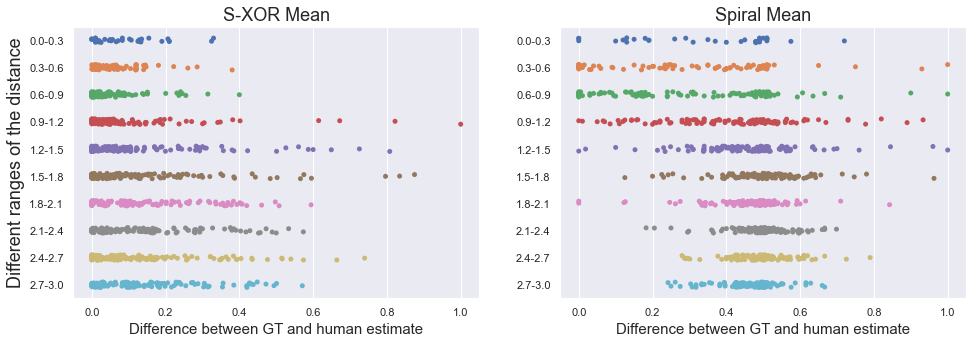

In [463]:
# df_var_d[1][9]

f = plt.figure(figsize=(8*2,5))
gs = f.add_gridspec(1,2)

ax = f.add_subplot(gs[0,0])
ax.set_title('S-XOR Mean', fontsize=18)
ax.set_ylabel('Different ranges of the distance', fontsize=18)
ax.set_xlabel('Difference between GT and human estimate', fontsize=15)

sns.stripplot(data=df_var_d0, orient='h', ax=ax)

ax = f.add_subplot(gs[0,1])
ax.set_title('Spiral Mean', fontsize=18)
ax.set_xlabel('Difference between GT and human estimate', fontsize=15)

sns.stripplot(data=df_var_d1, orient='h', ax=ax)

f.savefig(f'figs/{datetime.today().date()}_mean_strip_gt-est.png', bbox_inches='tight')

In [461]:
df_var_d0.describe().loc['std']

,0.0-0.3,0.3-0.6,0.6-0.9,0.9-1.2,1.2-1.5,1.5-1.8,1.8-2.1,2.1-2.4,2.4-2.7,2.7-3.0
count,37.000000,8.500000e+01,114.000000,1.150000e+02,1.250000e+02,1.240000e+02,1.260000e+02,1.260000e+02,1.260000e+02,1.260000e+02
mean,0.089481,6.020585e-02,0.047216,9.963743e-02,1.319459e-01,1.422975e-01,1.353805e-01,1.380848e-01,1.441333e-01,1.388154e-01
std,0.086666,6.919530e-02,0.071792,1.592958e-01,1.664139e-01,1.764513e-01,1.393584e-01,1.422889e-01,1.568974e-01,1.378134e-01
min,0.000000,1.332268e-14,0.000012,1.332268e-14,6.505262e-08,1.125371e-07,3.784495e-11,2.789469e-10,1.875611e-08,8.925089e-07
25%,0.017099,1.027389e-02,0.002479,1.000042e-02,1.310973e-02,1.458523e-02,2.168865e-02,2.259265e-02,2.263408e-02,2.398111e-02
50%,0.066212,4.076250e-02,0.017987,4.962252e-02,7.120365e-02,8.137863e-02,9.645368e-02,9.705667e-02,9.215457e-02,9.716852e-02
75%,0.132901,8.486484e-02,0.055915,1.121808e-01,1.869587e-01,2.074873e-01,2.018579e-01,1.981250e-01,1.955601e-01,1.976776e-01
max,0.330013,3.805417e-01,0.400000,9.999964e-01,8.076033e-01,8.748665e-01,5.945244e-01,5.734409e-01,7.396403e-01,5.706401e-01


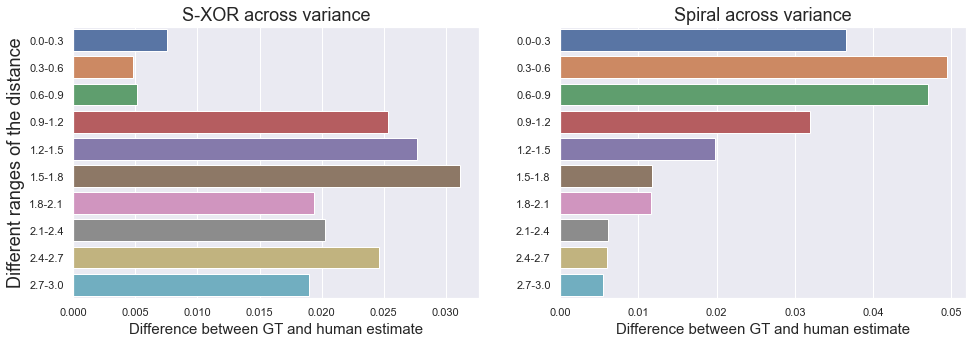

In [462]:
f = plt.figure(figsize=(8*2,5))
gs = f.add_gridspec(1,2)

ax = f.add_subplot(gs[0,0])
ax.set_title('S-XOR across variance', fontsize=18)
ax.set_ylabel('Different ranges of the distance', fontsize=18)
ax.set_xlabel('Difference between GT and human estimate', fontsize=15)

# sns.stripplot(data=df_var_d0, orient='h', ax=ax)
sns.barplot(data=(pd.DataFrame(df_var_d0.describe().loc['std']).T)**2, orient='h', ax=ax)

ax = f.add_subplot(gs[0,1])
ax.set_title('Spiral across variance', fontsize=18)
ax.set_xlabel('Difference between GT and human estimate', fontsize=15)

# sns.stripplot(data=df_var_d1, orient='h', ax=ax)
sns.barplot(data=(pd.DataFrame(df_var_d1.describe().loc['std']).T)**2, orient='h', ax=ax)

f.savefig(f'figs/{datetime.today().date()}_variance_bar_gt-est.png', bbox_inches='tight')

## comparing posterior along the line at 135 degree

In [239]:
import math
from scipy import spatial
from scipy.interpolate import griddata

In [257]:
def select_region(post, degree=0, b=0, r=0.1, step=0.1):
    '''
    r: radius of search parameter
    degree: degree of an angle
    b: y-intercept
    step: step of search w.r.t x-coordinate
    '''
    x = 0
    tree = spatial.cKDTree(uX) #putting [X,Y] coord. into scipy tree    
    theta = math.radians(degree)
    m = math.tan(theta)
    new_post = post
    new_idx = set()
    i = 0
    end = True

    while end:
        i += 1 #counter for run-on

        y = m * x + b
        idx_p = tree.query_ball_point([x, y], r)
        idx_n = tree.query_ball_point([-x, -y], r)
        
        if len(idx_p) == 0 and len(idx_n) == 0:
            end = False

        if i == 9999:
            end = False
            print('Reached max iteration')

        new_idx = new_idx.union(idx_p)
        new_idx = new_idx.union(idx_n)

        x += step
    
    return post[list(new_idx)], list(new_idx)


In [285]:
mods

['SVM', 'MLP', 'RF', 'QDA']

In [288]:
data

['Gaussian XOR', 'Uniform XOR', 'Spiral', 'Gaussian R-XOR', 'Gaussian S-XOR']

In [390]:
#line posterior
line_post = [[], []] #0: spiral, 1: xor

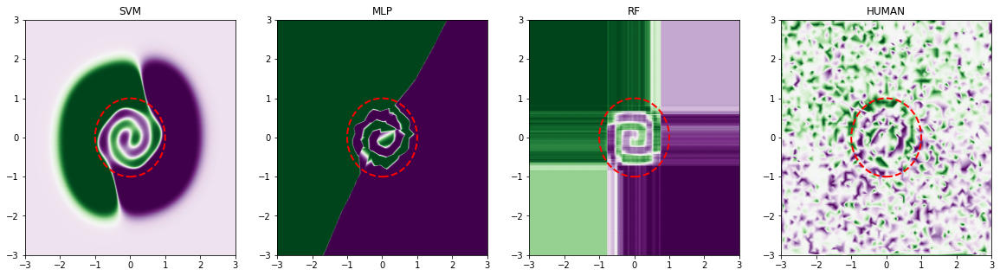

In [391]:
fig, axs = plt.subplots(1,4,figsize=[5*4,5])

label = mods[:3] + ['HUMAN']

for i in range(4):

    if i == 3:
        posterior = griddata((MT_4[:,3], MT_4[:,5]), MT_4[:,0], (uX0,uX1), method='linear', rescale=False).copy()
    else:
        posterior = Cpost[2][i].copy()
        
    temp_post, temp_idx = select_region(posterior, degree=135, step=0.05)
    mask = np.ones(posterior.size, dtype=bool)
    mask[temp_idx] = False
    line_post[0].append([temp_post, temp_idx])
    # posterior[mask] = 0.5

    axs[i].scatter(uX0, uX1, c=posterior, cmap=cmap, s=1)
    axs[i].add_patch(Circle((0,0), radius=1, linewidth=2, ls='--',edgecolor='r', fill=False))
    axs[i].set_xlim([-3,3])
    axs[i].set_ylim([-3,3])
    axs[i].set_title(label[i])

# fig.savefig(f'figs/{datetime.today().date()}_posterior_135line_spiral.png', bbox_inches='tight')
fig.savefig(f'figs/{datetime.today().date()}_posterior_spiral.png', bbox_inches='tight')

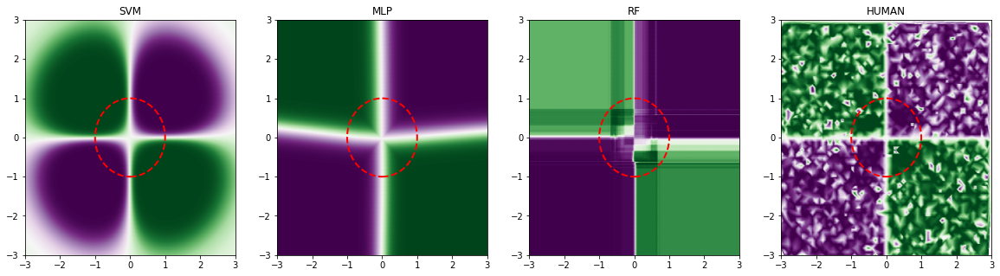

In [392]:
fig, axs = plt.subplots(1,4,figsize=[5*4,5])

label = mods[:3] + ['HUMAN']

for i in range(4):

    if i == 3:
        posterior = griddata((MT_2[:,3], MT_2[:,5]), MT_2[:,0], (uX0,uX1), method='linear', rescale=False).copy()
    else:
        posterior = Cpost[4][i].copy()
        
    temp_post, temp_idx = select_region(posterior, degree=135, step=0.05)
    mask = np.ones(posterior.size, dtype=bool)
    mask[temp_idx] = False
    line_post[1].append([temp_post, temp_idx])

    # posterior[mask] = 0.5
    # posterior[10000] = 0
    # posterior[10001] = 1 

    axs[i].scatter(uX0, uX1, c=posterior, cmap=cmap, s=1)
    axs[i].add_patch(Circle((0,0), radius=1, linewidth=2, ls='--',edgecolor='r', fill=False))
    axs[i].set_xlim([-3,3])
    axs[i].set_ylim([-3,3])
    axs[i].set_title(label[i])

# fig.savefig(f'figs/{datetime.today().date()}_posterior_135line_xor.png', bbox_inches='tight')
fig.savefig(f'figs/{datetime.today().date()}_posterior_xor.png', bbox_inches='tight')

In [506]:
# np.sqrt(uX[line_post[0][0][1]][:,0]**2 + uX[line_post[0][0][1]][:,1]**2)

line_plot = []
step = 0.2
x_range = np.arange(0,4,step)

for i in range(2):
    line_plot.append([])
    for j in range(4):
        line_plot[i].append([])
        for rad in x_range:              
            lp = line_post[i][j][0] #line posterior
            li = line_post[i][j][1] #line index
            x = uX[li][:,0]
            y = uX[li][:,1]
            dist = np.sqrt(x**2 + y**2)

            line_plot[i][j].append(np.array(lp[(dist >= rad) * (dist < rad+step)]).mean())


In [526]:
label
# pd.DataFrame(np.array(line_plot).T, columns=label)

['SVM', 'MLP', 'RF', 'HUMAN']

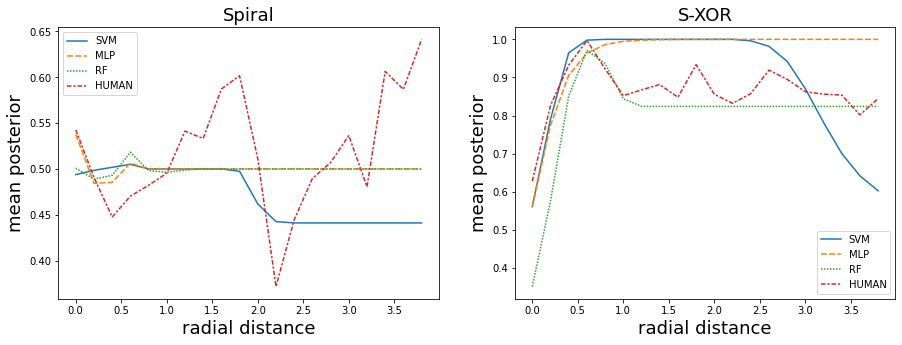

In [537]:
# line_plot[2]
fig, axs = plt.subplots(1,2,figsize=(5*3,5))

for i in range(2):
    tempdf = pd.DataFrame(np.array(line_plot[i]).T, columns=label)
    tempdf.index = x_range
    sns.lineplot(data=tempdf, ax=axs[i])
    # axs[i].set_ylim([0,1])
    axs[i].set_title(['Spiral', 'S-XOR'][i], fontsize=18)
    # if i == 0:
    axs[i].set_ylabel('mean posterior', fontsize=18)
    axs[i].set_xlabel('radial distance', fontsize=18)

fig.savefig(f'figs/{datetime.today().date()}_posterior_135line_lineplot.png', bbox_inches='tight')

## modify MLP to plot pre-post activation (of the output layer, from sigmoid to identity)

In [140]:
from sklearn.base import clone
from sklearn.base import copy

In [103]:
clf

[NuSVC(gamma='auto', probability=True),
 MLPClassifier(alpha=0, hidden_layer_sizes=100, learning_rate_init=0.0001,
               max_iter=7000),
 RandomForestClassifier(max_depth=10, n_estimators=128, n_jobs=-1),
 QuadraticDiscriminantAnalysis()]

In [127]:
clf[1].out_activation_, clf[1].activation, clf[1].hidden_layer_sizes, clf[1].n_features_in_, clf[1].n_outputs_, clf[1].n_layers_, clf[1].max_iter, clf[1].alpha

('logistic', 'relu', 100, 2, 1, 3, 7000, 0)

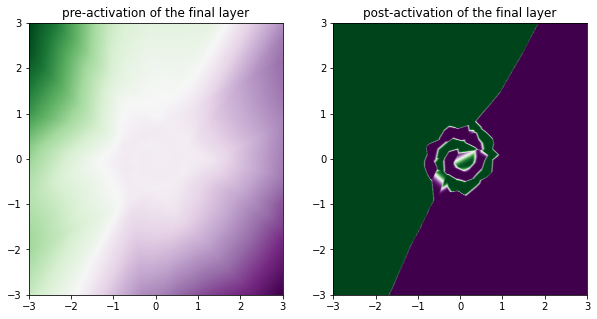

In [404]:
fig, axs = plt.subplots(1,2,figsize=(5*2,5))

clf = select_clf(2, cc=True)
clf_mod = copy.deepcopy(clf[1])
clf_mod.out_activation_ = 'identity'

axs[0].scatter(uX0, uX1, c=clf_mod.predict_proba(uX)[:,1], cmap=cmap, s=1)

axs[0].set_xlim([-3,3])
axs[0].set_ylim([-3,3])
axs[0].set_title('pre-activation of the final layer')

clf = select_clf(2, cc=True)
clf_mod = copy.deepcopy(clf[1])
# clf_mod.out_activation_ = 'identity'

axs[1].scatter(uX0, uX1, c=clf_mod.predict_proba(uX)[:,1], cmap=cmap, s=1)

axs[1].set_xlim([-3,3])
axs[1].set_ylim([-3,3])
axs[1].set_title('post-activation of the final layer')

fig.savefig(f'figs/{datetime.today().date()}_MLP_pre-post_spiral.png', bbox_inches='tight')

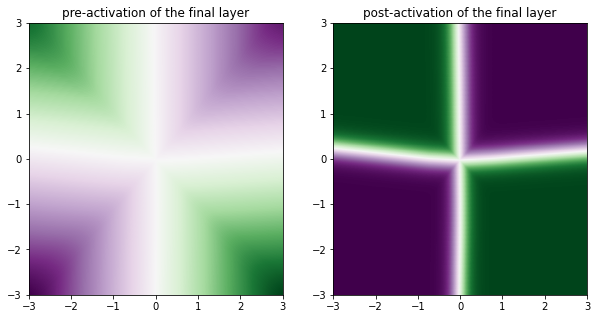

In [406]:
fig, axs = plt.subplots(1,2,figsize=(5*2,5))

clf = select_clf(4, cc=True)
clf_mod = copy.deepcopy(clf[1])
clf_mod.out_activation_ = 'identity'

axs[0].scatter(uX0, uX1, c=clf_mod.predict_proba(uX)[:,1], cmap=cmap, s=1)

axs[0].set_xlim([-3,3])
axs[0].set_ylim([-3,3])
axs[0].set_title('pre-activation of the final layer')

clf = select_clf(4, cc=True)
clf_mod = copy.deepcopy(clf[1])
# clf_mod.out_activation_ = 'identity'

axs[1].scatter(uX0, uX1, c=clf_mod.predict_proba(uX)[:,1], cmap=cmap, s=1)

axs[1].set_xlim([-3,3])
axs[1].set_ylim([-3,3])
axs[1].set_title('post-activation of the final layer')

fig.savefig(f'figs/{datetime.today().date()}_MLP_pre-post_xor.png', bbox_inches='tight')

## DARPA Figure

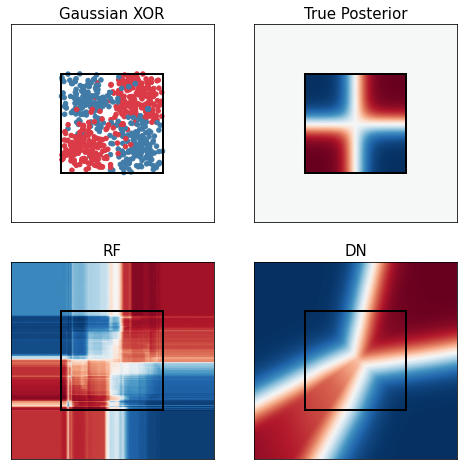

In [373]:
plot_posterior(h=0.01, enable=[0,0,1,0], savefile=False)

## NSF AI Figure

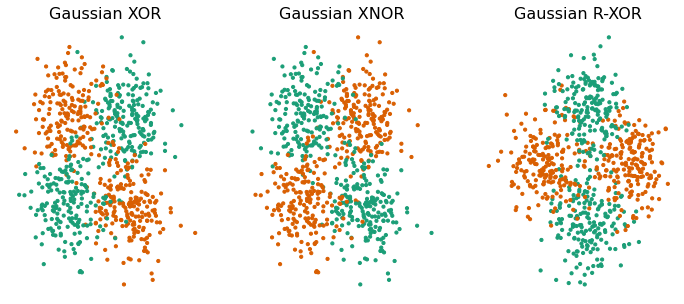

In [47]:
colors = sns.color_palette('Dark2', n_colors=5)

gausX, gausY = generate_gaussian_parity(750, mean=np.array([-1,-1]), cov_scale=0.1, angle_params=np.pi, contain=False)
gausRX, gausRY = generate_gaussian_parity(750, mean=np.array([-1,-1]), cov_scale=0.1, angle_params=np.pi/4, contain=False)

fig, ax = plt.subplots(1,3, figsize=(12,5))

ax[0].scatter(gausX[:,0],gausX[:,1], c=get_colors(colors, gausY), s=10)
ax[1].scatter(gausX[:,0],gausX[:,1], c=get_colors(colors, abs(gausY-1)), s=10)
ax[2].scatter(gausRX[:,0],gausRX[:,1], c=get_colors(colors, gausRY), s=10)

ax[0].set_title('Gaussian XOR', fontsize=16)
ax[1].set_title('Gaussian XNOR', fontsize=16)
ax[2].set_title('Gaussian R-XOR', fontsize=16)

for i in range(3):
    ax[i].axis('off')

fig.savefig('figs/NSF_AI_fig.png', bbox_inches='tight')

## Unified colorbar (in progress)

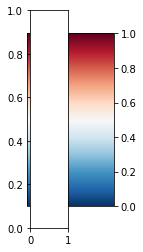

In [7]:
# import pylab as pl
# import numpy as np

# a = np.array([[0,1]])
# fig = plt.figure()
# axs = fig.add_subplot(111)
fig = plt.figure(figsize=(0.5*3, 4))
axs = fig.add_subplot(111)
axs = plt.imshow([[0,1]], cmap='RdBu_r')
axs = plt.gca().set_visible(False)
cax = plt.axes([0.1, 0.2, 0.8, 0.6])
axs = plt.colorbar(orientation="vertical", cax=cax)
axs = fig.add_subplot(121)



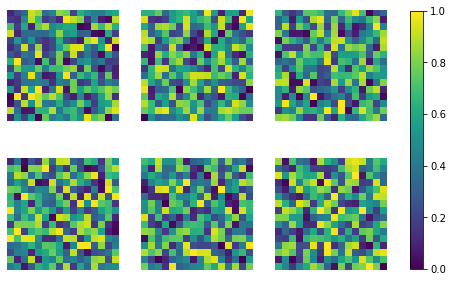

In [174]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(8.5, 5))

for ax in axes.flat:
    ax.set_axis_off()
    im = ax.imshow(np.random.random((16, 16)), cmap='viridis',
                   vmin=0, vmax=1)

# notice that here we use ax param of figure.colorbar method instead of

# the cax param as the above example

axes = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95)

cbar.set_ticks(np.arange(0, 1.1, 0.5))
cbar.set_ticklabels(['low', 'medium', 'high'])

plt.show()

## End of notebook